# Data & Apprentissage, M2CHPS 2023

## Assignments - Part 2

**Instructor:** [Argyris Kalogeratos](http://kalogeratos.com) (contact: argyris.kalogeratos@ens-paris-saclay.fr).  
**Sylabus:** [http://nvayatis.perso.math.cnrs.fr/CHPScourse.html](http://nvayatis.perso.math.cnrs.fr/CHPScourse.html)

The most updated version of this file can be found at instructor's webpage:  
[http://kalogeratos.com/MyCourses/DML-M2HPC/Assignments2.ipynb](http://kalogeratos.com/psite/files/MyCourses/DML-M2HPC/Assignments1.ipynb).


---

## Import

In [3]:
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
from sklearn.metrics import pairwise_distances
from sklearn.neighbors import LocalOutlierFactor
from sklearn.ensemble import IsolationForest
from sklearn.datasets import make_blobs
from sklearn.metrics import pairwise_distances_argmin
from scipy.spatial.distance import cdist
from sklearn.cluster import KMeans
from copy import deepcopy
from matplotlib.gridspec import GridSpec
from sklearn.datasets import load_sample_image
from sklearn.utils import shuffle
from time import time
from sklearn.mixture import GaussianMixture
from sklearn.metrics import adjusted_rand_score
import pandas as pd
from scipy.stats import multivariate_normal
from scipy.optimize import linear_sum_assignment
from scipy.spatial.distance import cdist

## Exercise 1 [15%]

### a
**Variables:**
- \( b \): Battery functions properly : \( b = 1 \).
- " " " " " " " " " " " " " " fails   : \( b = 0 \).

- \( c \): Sensor c functions properly : \(c = 1 \).
- " " " " " " " " " " " " " " fails    : \(c = 0 \).

- \( d \): Sensor d functions properly : \(d = 1 \).
- " " " " " " " " " " " " " " fails    : \(d = 0 \).

- \( a \): Alarm fires : (\ a = 1 \).
- " " " " " " " " " " " " " " not fires   : \(a = 0 \).

**Dependencies:**

   - The sensors\( c \) and \( d \) are independant but both of their efficiency depend of \( d \) because the sensors can work with internal power but are less efficient.
   - The alarm \( a \) depends on the sensors \( c \) and \( d \).
   - The alarm \( a \) can work with one sensor with reduced probability.
   - If both sensors dies, the alarm fires with a higher probability.

**Graphical Model of the system:**

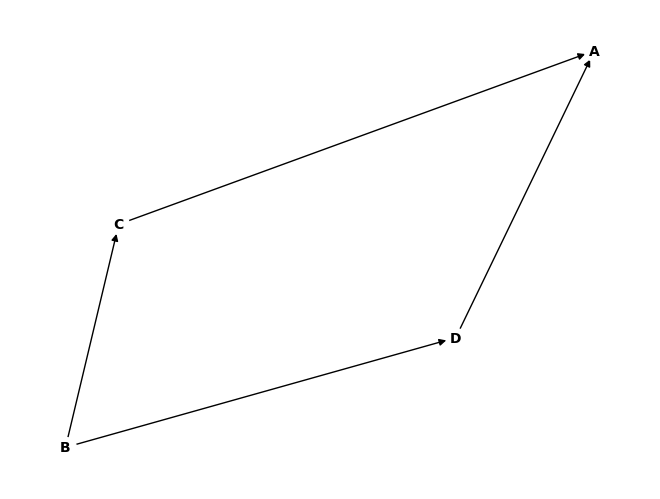

In [9]:
G = nx.DiGraph()
G.add_nodes_from(["A", "B", "C", "D"])
edges = [("B", "C"), ("B", "D"), ("C", "A"), ("D", "A")]
G.add_edges_from(edges)

pos = nx.spring_layout(G)
nx.draw(G, pos, with_labels = True, node_size = 200, node_color = "white", font_size = 10, font_weight = "bold", arrowsize = 10)

plt.show()


---

### b

$P(b = 1) = 0.9$

$P(b = 0) = 1 - P(b = 1) = 1 - 0.9 = 0.1$

**For b = 1 :**   
    $P(c = 1 ∣ b = 1) = 1 - P(c = 0 ∣ b = 1) = 1 - 0.01 = 0.99$  
    $P(c = 0 ∣ b = 1) = 0.01$  
    $P(d = 1 ∣ b = 1) = 1 - P(d = 0 ∣ d = 1) = 1 - 0.01 = 0.99$  
    $P(d = 0 | b = 1) = 0.01$  
    
    
**For b = 0 :**     
    $P(c = 1 ∣ b = 0) = 1 - P(c = 0 ∣ b = 0) = 1 - 0.7 = 0.3$  
    $P(c = 0 ∣ b = 0) = 0.7$  
    $P(d = 1 ∣ b = 0) = 1 - P(d = 0 ∣ b = 0) = 1 - 0.7 = 0.3$  
    $P(d = 0 ∣ b = 0) = 0.7$  


**For c = 1 || d = 1 :**    
    $P(a = 1 ∣ c, d) = 0.02$  
    $P(a = 0 ∣ c, d) = 1 - P(a = 1 ∣ c, d) = 0.98$  
      
     
**For c = 0 && d = 0 :**    
    $P(a = 1 ∣ c = 0, d = 0) = P(a = 1 | b = 0 || c = 0) * 30 = 0.02 * 30 = 0.6$  
    $P(a = 0 ∣ c = 0, d = 0) = 1 - P(a = 1 ∣ c = 0, d = 0) = 0.4$  
    

#### Tables of probabilities for better lisibility: 
<div style="display: flex; gap: 5px;">

  <!-- First Tab -->
  <table>
    <thead>
      <tr>
        <th>b = 1</th>
        <th>b = 0</th>
      </tr>
    </thead>
    <tbody>
      <tr>
        <td>0.9</td>
        <td>0.1</td>
      </tr>
    </tbody>
  </table>

  <!-- Second Tab -->
  <table>
    <thead>
      <tr>
        <th>p</th>
        <th>c = 1</th>
        <th>c = 0</th>
      </tr>
    </thead>
    <tbody>
      <tr>
        <th>b = 1</th>
        <td>0.99</td>
        <td>0.01</td>
      </tr>
      <tr>
        <th>b = 0</th>
        <td>0.3</td>
        <td>0.7</td>
      </tr>
    </tbody>
  </table>

  <!-- Third Tab -->
  <table>
    <thead>
      <tr>
        <th>p</th>
        <th>d = 1</th>
        <th>d = 0</th>
      </tr>
    </thead>
    <tbody>
      <tr>
        <th>b = 1</th>
        <td>0.99</td>
        <td>0.01</td>
      </tr>
      <tr>
        <th>b = 0</th>
        <td>0.3</td>
        <td>0.7</td>
      </tr>
    </tbody>
  </table>

  <!-- Fourth Tab -->
  <table>
    <thead>
      <tr>
        <th>p</th>
        <th>a = 1</th>
        <th>a = 0</th>
      </tr>
    </thead>
    <tbody>
      <tr>
        <th>(c = 1, d = 1)</th>
        <td>0.98</td>
        <td>0.02</td>
      </tr>
      <tr>
        <th>(c = 0, d = 0)</th>
        <td>0.4</td>
        <td>0.6</td>
      </tr>
      <tr>
        <th>(c = 1, d = 0)</th>
        <td>0.98</td>
        <td>0.02</td>
      </tr>
      <tr>
        <th>(c = 0, d = 1)</th>
        <td>0.98</td>
        <td>0.02</td>
      </tr>
    </tbody>
  </table>
</div>

#### Table of joint probability P(a, b, c, d)
$P(a, b, c, d) = P(a ∣ c, d) * P(b) * P(c ∣ b) * P(d ∣ b)$

We have $2^k$ combinations $(k = 4) => 2^4 = 16$ combinations using the above formula, here is the said table :

|            | b | c | d | a | P(b)  | P(c\|b) | P(d\|b) | P(a\|c,d) | p(a, b, c, d)  |
|-------------|---|---|---|---|-------|---------|---------|-----------|----------------|
| 1           | 1 | 1 | 1 | 1 | 0,9   | 0,99    | 0,99    | 0,02      | <span style="color:green">0.0176418</span>      |
| 2           | 1 | 1 | 1 | 0 | 0,9   | 0,99    | 0,99    | 0,98      | <span style="color:green">0.8644482</span>      |
| 3           | 1 | 1 | 0 | 1 | 0,9   | 0,99    | 0,01    | 0,02      | <span style="color:green">0.0001782</span>      |
| 4           | 1 | 1 | 0 | 0 | 0,9   | 0,99    | 0,01    | 0,98      | <span style="color:green">0.0087318</span>      |
| 5           | 1 | 0 | 1 | 1 | 0,9   | 0,01    | 0,99    | 0,02      | <span style="color:green">0.0001782</span>      |
| 6           | 1 | 0 | 1 | 0 | 0,9   | 0,01    | 0,99    | 0,98      | <span style="color:green">0.0087318</span>     |
| 7           | 1 | 0 | 0 | 1 | 0,9   | 0,01    | 0,01    | 0,6       | <span style="color:green">0.000054</span>      |
| 8           | 1 | 0 | 0 | 0 | 0,9   | 0,01    | 0,01    | 0,4       | <span style="color:green">0.000036</span>       |
| 9           | 0 | 1 | 1 | 1 | 0,1   | 0,3     | 0,3     | 0,02      | <span style="color:green">0.00018</span>        |
| 10          | 0 | 1 | 1 | 0 | 0,1   | 0,3     | 0,3     | 0,98      | <span style="color:green">0.00882</span>        |
| 11          | 0 | 1 | 0 | 1 | 0,1   | 0,3     | 0,7     | 0,02      | <span style="color:green">0.00042</span>         |
| 12          | 0 | 1 | 0 | 0 | 0,1   | 0,3     | 0,7     | 0,98      | <span style="color:green">0.02058</span>        |
| 13          | 0 | 0 | 1 | 1 | 0,1   | 0,7     | 0,3     | 0,02      | <span style="color:green">0.00042</span>         |
| 14          | 0 | 0 | 1 | 0 | 0,1   | 0,7     | 0,3     | 0,98      | <span style="color:green">0.02058</span>        | 
| 15          | 0 | 0 | 0 | 1 | 0,1   | 0,7     | 0,7     | 0,6       | <span style="color:green">0.0294</span>         |
| 16          | 0 | 0 | 0 | 0 | 0,1   | 0,7     | 0,7     | 0,4       | <span style="color:green">0,0196 </span>        | 


$p(a, b, c, d) = \sum_i p_i(a, b, c, d) = 1$

Now, to find p(a, c), we jsut need to sum every probabilities of p(a, b, c, d) over every values of b & d :  
$p(a,c) = \sum_b \sum_d p(a,b,c,d)$   
$p(a = 1, c = 1) = p(line_1) + p(line_3) + p(line_9) + p(line_{11}) = 0.0176418 + 0.0001782 + 0.00018 + 0.00042 = 0.01842$   
$p(a = 0, c = 1) = p(line_2) + p(line_4) + p(line_{10}) + p(line_{12}) = 0.8644478 + 0.0087318 + 0.00882 + 0.02058 = 0.90258$

$p(a = 1, c = 0) = p(line_5) + p(line_7) + p(line_{13}) + p(line_{15}) = 0.0001782 + 0.000054 + 0.00042 + 0.0294 = 0.0300522$   
$p(a = 0, c = 0) = p(line_6) + p(line_8) + p(line_{14}) + p(line_{16}) = 0.0087318 + 0.000036 + 0.02058 + 0.0196 = 0.0489478$

That gives uses the final table of p(a, c) :  
<table border="1" style="text-align: center; border-collapse: collapse;">
  <thead>
    <tr>
      <th>p</th>
      <th>a = 1</th>
      <th>a = 0</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <th>c = 1</th>
      <td>0.01842</td>
      <td>0.90258</td>
    </tr>
    <tr>
      <th>c = 0</th>
      <td>0.0300522</td>
      <td>0.0489478</td>
    </tr>
  </tbody>
</table>

If $p(c,d) <=> p(c) * p(d)$ then  $c$ & $d$ are independant : 

$p(c = 1) = \sum_a \sum_b \sum_d p(a,b,c = 1, d)$
         $= p(line_1) + p(line_2) + p(line_{3}) + p(line_{4}) + p(line_9) + p(line_{10}) + p(line_{11}) + p(line_{12})$
         
         $= 0,0176418 + 0,8644482 + 0,0001782 + 0,0087318 + 0,00018 + 0,00882 + 0,00042 + 0,02058$
         
         $= 0,921$           
$p(c = 0) = \sum_a \sum_b \sum_d p(a,b,c = 0, d)$
         $= p(line_5) + p(line_6) + p(line_{7}) + p(line_{8}) + p(line_{13}) + p(line_{14}) + p(line_{15}) + p(line_{16})$
         $= 0.0001782 + 0.0087318 + 0.000054 + 0.000036 + 0.00042 + 0.02058 + 0.0294 + 0.0196$
         $= 0.079$
         
$p(d = 1) = \sum_a \sum_b \sum_c p(a,b,c,d = 1)$
         $= p(line_1) + p(line_2) + p(line_{5}) + p(line_{6}) + p(line_9) + p(line_{10}) + p(line_{13}) + p(line_{14})$
         
         $= 0.0176418 + 0.8644482 + 0.0001782 + 0.0087318 + 0.00018 + 0.00882 + 0.00042 + 0.02058$
         
         $= 0.921$$           
$p(d = 0) = \sum_a \sum_b \sum_c p(a,b,c,d = 0)$
         $= p(line_3) + p(line_4) + p(line_{7}) + p(line_{8}) + p(line_{11}) + p(line_{12}) + p(line_{15}) + p(line_{16})$
         
         $= 0.0001782 + 0.0087318 + 0.000054 + 0.000036 + 0.00042 + 0.02058 + 0.0294 + 0.0196$
         
         $= 0.079$

Conjoint probability of $(p, c)$ :  

$p(c = 1, d = 1) = p(line_1) + p(line_2) + p(line_9) + p(line_{10})$

                $= 0.0176418 + 0.8644482 + 0.00018 + 0.00882$  
                
                $= 0.89109$    
$p(c = 1, d = 0) = p(line_3) + p(line_4) + p(line_{11}) + p(line_{12})$     

                $= 0.0001782 + 0.0087318 + 0.00042 + 0.02058$   
                
                $= 0.02991$     
$p(c = 0, d = 1) = p(line_{5}) + p(line_{6}) + p(line_{13}) + p(line_{14})$   

                $= 0.0001782 + 0.0087318 + 0.00042 + 0.02058$    
                
                $= 0.02991$    
$p(c = 0, d = 0) = p(line_{7}) + p(line_{8}) + p(line_{15}) + p(line_{16}$)$   

                $= 0.000054 + 0.000036 + 0.0294 + 0.0196$    
                
                $= 0.04909$     


Now we compute $p(c) * p(d)$ and compare the different result to $p(c, d)$ : 

$p(c = 1) * p(d = 1) = 0.921 * 0.921 = 0.848241$
$p(c = 1, d = 1) = 0.89109 \neq 0.848241$ $=>$ $c$ & $d$ not independant 

$p(c = 1) * p(d = 0) = 0.921 * 0.079 = 0.072759$  
$p(c = 1, d = 0) = 0.02991 \neq 0.072759$ $=>$ $c$ & $d$ not independant 

$p(c = 0) * p(d = 1) = 0.079 * 0.921 = 0,072759$  
$p(c = 0, d = 1) = 0.02991 \neq 0.072759$ $=>$ $c$ & $d$ not independant 

$p(c = 0) * p(d = 0) = 0.079 * 0.079 = 0,006241$    
$p(c = 0, d = 0) = 0.04909 \neq 0.006241$ $=>$ $c$ & $d$ not independant 

---

### C

We need to compute $P(b = 0 | a = 0, c = 0, d = 1)$

For that we need $P(a = 0 | c = 0, d = 1) = 0.98$

Finally we compute the joint probabilities :   
$P(a = 0, c = 0, d = 1, b)$

$P(a = 0, c = 0, d = 1, b = 0) = P(b = 0) * P(c = 0 ∣ b = 0) * P(d = 1 ∣ b = 0) * P(a = 0 ∣ c = 0, d = 1)$  
                              $= 0.1 * 0.7 * 0.3 * 0.98 = 0.02058$

 
$P(a = 0, c = 0, d = 1, b = 1) = P(b = 1) * P(c = 0 ∣ b = 1) * P(d = 1 ∣ b = 1) * P(a = 0 ∣ c = 0, d = 1)$
                              $=0.9 * 0.01 * 0.99 * 0.98 = 0.0087318$

We compute the total probability  
$P(a = 0, c = 0, d = 1) = P(a = 0, c = 0, d = 1, b = 0) + P(a = 0, c = 0, d = 1, b = 1) = 0.02058 + 0.0087318 = 0.0293118$

Then we apply the Bayes error formula :  
$P(b = 0 ∣ a = 0, c = 0, d = 1) = \frac{P(a = 0, c = 0, d = 1, b = 0)}{P(a = 0, c = 0, d = 1)} = \frac{0.02058}{0.0293118} \approx 0.7021$

The posterior probability of a not functional battery is approximatively $70.021\%$

---

### d

The easiest way to do that is to compute $p(a = 1)$ because $p(a = 0) = 1 - p(a = 1)$ :

$P(a  =1 |c, d) = 0.02$
$P(a = 1 | c = 0, d = 0) = 0.6$

We then compute the joint probabilities of $P(c, d)$ :

$P(c = 1, d = 1)$ :  
$P(c = 1, d = 1) = P(b = 1) * P(c = 1 | b = 1) * P(d = 1 | b = 1) + P(b = 0) * P(c = 1 | b = 0) * P(d = 1 | b = 0) = 0.9 * 0.99 * 0.99 + 0.1 * 0.3 * 0.3 = 0.89109$

$P(c = 1, d = 0)$ :  
$P(c = 1, d = 0) = P(b = 1) * P(c = 1 | b = 1) * P(d = 0 | b = 1) + P(b = 0) * P(c = 1 | b = 0) * P(d = 0 | b = 0) = 0.9 * 0.99 * 0.01 + 0.1 * 0.3 * 0.7 = 0.02991$

$P(c = 0, d = 1)$ :   
$P(c = 0, d = 1) = P(b = 1) * P(c = 0 | b = 1) * P(d = 1 | b = 1) + P(b = 0) * P(c = 0 | b = 0) * P(d = 1 | b = 0) = 0.9 * 0.01 * 0.99 + 0.1 * 0.7 * 0.3 = 0.02991$

$P(c = 0, d = 0)$ :  
$P(c = 0, d = 0) = P(b = 1) * P(c = 0 | b = 1) * P(d = 0 | b = 1) + P(b = 0) * P(c = 0 | b = 0) * P(d = 0 | b = 0) = 0.9 * 0.01 * 0.01 + 0.1 * 0.7 * 0.7 = 0.04909$

Finally we can obtain $p(a = 1)$ lke that :  
$p(a = 1) = \sum_{c,d} P(a = 1 | c, d) * P(c, d)$

$P(a = 1 | c = 1, d = 1) = 0.02$  
$0.02 * 0.89109 = 0.0178218$

$P(a = 1 | c = 1, d = 0) = 0.02$  
$0.02 * 0.02991 = 0.0005982$

$P(a = 1 | c = 0, d = 1) = 0.02$    
$0.02 * 0.02991 = 0.0005982$

$P(a = 1 | c = 0, d = 0) = 0.6$  
$0.6 * 0.04909 = 0.029454$

Total :  
$p(a = 1) = 0.0178218 + 0.0005982 + 0.0005982 + 0.029454 = 0.0484722$

$==> p(a = 0) = 1 - P(a = 1) = 1 - 0.0484722 \approx 0,9515$

To conclude, the probability of the alarm going silent is aproximatively $95.15\%$.

---

### e

$P(all\_sensors\_are\_down) = P(b = 1) * P(fail_{b = 1})^n + P(b = 0) * P(fail_{b = 0})^n$ $<=>$ with: $P(fail_{b = 1}) = 0.01$ & $P(fail_{b = 0}) = 0.7$

$=>$ $P(all\_sensors\_are\_down) = P(b = 1) * P(fail_{b = 1})^n + P(b = 0) * P(fail_{b = 0})^n = 0.9 * 0.01^n + 0.1 * 0.7^n$  

We need to find n :  
$p(a = 1) = P(a = 1 | at\_least\_1\_sensor\_up) * (1 - p_S) + P(a = 1 | all\_sensors\_are\_down) * p_S$   
$p(a = 1) = 0.02 * (1 - p_S) + 0.6 * p_S$    
$p(a = 1) = 0.02 + 0.58 * p_S$ $<=>$ $0.02 + 0.58 * p_S < 0.05 <=> 0.58 * p_S < 0.03$ $<=>$ $p_S < \frac{0.03}{0.58} \approx 0.05172$

Finally, if I replace n by 2 we get the wanted result :   
$p_S = 0.9 * 0.01^2 + 0.1 * 0.7^2 = 0.04909$    
$p(a = 1) = 0.02 + 0.58 * 0.04909 = 0.0484722 < 0.05$  

So we need AT LEAST 2 sensor.

---

### f

What we want to compute is :   
$P(b = 0 | a = 0)$

Firstly,

$P(a = 0 | b = 0)= \sum_{c,d}P(a = 0 | c, d) * P(c | b = 0) * P(d | b = 0)$

To do so, we will our probabilities computed until now :    
$P(c = 1 | b = 0) = 0.3$   
$P(c = 0 | b = 0) = 0.7$   
$P(d = 1 | b = 0) = 0.3$    
$P(d = 0 | b = 0) = 0.7$   
$P(a = 0 | c = 0, d = 0) = 0.4$   
$P(a = 0 | c = 1, d = 1) = 0.98$    
      
$c = 1, d = 1 : 0.98 * 0.3 * 0.3 = 0.0882$    
$c = 1, d = 0 : 0.98 * 0.3 * 0.7 = 0.2058$   
$c = 0, d = 1 : 0.98 * 0.7 * 0.3 = 0.2058$    
$c = 0, d = 0 : 0.4 * 0.7 * 0.7 = 0.196$   
  
$=>$ $P(a = 0 | b = 0) = 0.0882 + 0.2058 + 0.2058 + 0.196 = 0.6958$


$P(c = 1 | b = 1) = 0.99$  
$P(c = 0 | b = 1) = 0.01$   
$P(d = 1 | b = 1) = 0.99$   
$P(d = 0 | b = 1) = 0.01$   

$c = 1, d = 1 : 0.98 * 0.99 * 0.99 = 0.960498$  
$c = 1, d = 0 : 0.98 * 0.99 * 0.01 = 0.009702$   
$c = 0, d = 1 : 0.98 * 0.01 * 0.99 = 0.009702$   
$c = 0, d = 0 : 0.4 * 0.01 * 0.01 = 0.00004$ 

$=>$ $P(a = 0 | b = 1) = 0.960498 + 0.009702 + 0.009702 + 0.00004 = 0.979942$


Secondly;

$P(a = 0) = P(a = 0 | b = 0) * P(b = 0) + P(a = 0 | b = 1) * P(b = 1) = 0.6958 * 0.1 + 0.979942 * 0.9 = 0.9515278$


Finally, 

$P(b = 0 | a = 0) = \frac{P(a = 0 | b = 0) * P(b = 0)}{P(a = 0)} = \frac{0.06958}{0.9515278} \approx 0.0731$

The probability that the battery is not working in this scenario is approximatively 7.31%

---

### g

In [33]:
def simulation(num_simulations=100000):
    cpt_a0 = 0
    cpt_b0_given_a0 = 0
    cpt_b0_c0_d1_a0 = 0
    cpt_c0_d1_a0 = 0

    P_b = [0.9, 0.1]  # P(b=1), P(b=0)

    P_c_given_b = {1: [0.99, 0.01], 0: [0.3, 0.7]}  # P(c=1|b), P(c=0|b)
    P_d_given_b = {1: [0.99, 0.01], 0: [0.3, 0.7]}  # P(d=1|b), P(d=0|b)

    def P_a_given_c_d(c, d):
        if c == 0 and d == 0:
            return [0.4, 0.6]  # P(a=0|c=0,d=0), P(a=1|c=0,d=0)
        else:
            return [0.98, 0.02]  # P(a=0|c,d), P(a=1|c,d)

    # Simulation for Questions c, d, f, g
    for _ in range(num_simulations):
        b = np.random.choice([1, 0], p=P_b)

        c = np.random.choice([1, 0], p=P_c_given_b[b])
        d = np.random.choice([1, 0], p=P_d_given_b[b])

        P_a = P_a_given_c_d(c, d)
        a = np.random.choice([0, 1], p=P_a)

        # Counting for p(a=0)
        if a == 0:
            cpt_a0 += 1

            # Counting for P(b=0|a=0)
            if b == 0:
                cpt_b0_given_a0 += 1

            # Counting for P(b=0|a=0, c=0, d=1)
            if c == 0 and d == 1:
                cpt_c0_d1_a0 += 1
                if b == 0:
                    cpt_b0_c0_d1_a0 += 1

    # Compute estimated probabilities
    p_a0 = cpt_a0 / num_simulations  # Question d
    p_b0_given_a0 = cpt_b0_given_a0 / cpt_a0  # Question f
    p_b0_given_a0_c0_d1 = (cpt_b0_c0_d1_a0 / cpt_c0_d1_a0) if cpt_c0_d1_a0 > 0 else 0  # Question c

    # Simulation for e
    num_sensors_list = list(range(0, 11))
    simulation_results_e = {}
    min_sensors_required = None

    for num_sensors in num_sensors_list:
        cpt_a1_e = 0  # Counter for p(a=1) 

        for _ in range(num_simulations):
            b = np.random.choice([1, 0], p=P_b)

            sensors = []
            for _ in range(num_sensors):
                if b == 1:
                    sensor_state = np.random.choice([1, 0], p=[0.99, 0.01])
                else:
                    sensor_state = np.random.choice([1, 0], p=[0.3, 0.7])
                sensors.append(sensor_state)

            if len(sensors) == 0:
                P_a = [0.4, 0.6]  # P(a=0), P(a=1)
            else:
                if any(sensor == 1 for sensor in sensors):
                    P_a = [0.98, 0.02]  # P(a=0), P(a=1)
                else:
                    P_a = [0.4, 0.6]  # P(a=0), P(a=1)

            a = np.random.choice([0, 1], p=P_a)

            if a == 1:
                cpt_a1_e += 1

        p_a1_e = cpt_a1_e / num_simulations
        simulation_results_e[num_sensors] = p_a1_e

        # Check if p(a=1) < 0.05 and record the minimum number of sensors
        if p_a1_e < 0.05 and min_sensors_required is None:
            min_sensors_required = num_sensors

    return p_b0_given_a0_c0_d1, p_a0, min_sensors_required, simulation_results_e, p_b0_given_a0

# simulation
p_b0_given_a0_c0_d1_sim, p_a0_sim, min_sensors_required, simulation_results_e, p_b0_given_a0_sim = simulation()


print(f"c) battery is dead:{p_b0_given_a0_c0_d1_sim:.4f}\n")

print(f"d) alarm is silent:{p_a0_sim:.4f}\n")

for num_sensors, p_a1 in simulation_results_e.items():
    print(f"Number of sensors: {num_sensors}, P(a=1): {p_a1:.4f}")
print()
print(f"e) Minimum number of sensors for P(a=1) < 0.05:{min_sensors_required}")

print(f"f) the battery is dead:{p_b0_given_a0_sim:.4f}\n")

c) battery is dead:0.7075

d) alarm is silent:0.9528

Number of sensors: 0, P(a=1): 0.6013
Number of sensors: 1, P(a=1): 0.0673
Number of sensors: 2, P(a=1): 0.0484
Number of sensors: 3, P(a=1): 0.0407
Number of sensors: 4, P(a=1): 0.0335
Number of sensors: 5, P(a=1): 0.0297
Number of sensors: 6, P(a=1): 0.0257
Number of sensors: 7, P(a=1): 0.0241
Number of sensors: 8, P(a=1): 0.0240
Number of sensors: 9, P(a=1): 0.0222
Number of sensors: 10, P(a=1): 0.0223

e) Minimum number of sensors for P(a=1) < 0.05:2
f) the battery is dead:0.0730




---
---

## Exercise 2 [30%]

### a

In [4]:
def lof(X, n_neighbors = 20):
    """
    Compute LOF scores.
    
    Parameters:
    - X : Input data points (num_samples, num_features).
    - n_neighbors (int): Number of neighbors to consider.
    
    Returns:
    - lof_scores (numpy array): LOF scores for each point in X.
    """
    
    distances = pairwise_distances(X, metric = 'euclidean')
    
    # Compute neighbors for each point
    num_samples = X.shape[0]
    k = n_neighbors

    k_distances = np.zeros(num_samples)  
    neighbors = []  

    for i in range(num_samples):
        # Sort distances
        sorted_indices = np.argsort(distances[i])
        sorted_distances = distances[i][sorted_indices]
        
        # Remove distance = 0
        sorted_indices = sorted_indices[sorted_indices != i]
        sorted_distances = sorted_distances[sorted_distances != 0]
        
        k_distance = sorted_distances[k - 1]
        k_distances[i] = k_distance
        
        neighbor_indices = sorted_indices[sorted_distances <= k_distance]
        neighbors.append(neighbor_indices)
    
    # Compute reachability distances for each point
    reachability_distances = []
    for i in range(num_samples):
        reach_dist = []
        for j in neighbors[i]:
            reach_dist.append(max(k_distances[j], distances[i][j]))
        reachability_distances.append(reach_dist)
    
    # Compute LRD for each point
    lrd = np.zeros(num_samples)
    for i in range(num_samples):
        lrd[i] = len(neighbors[i]) / np.sum(reachability_distances[i])
    
    # Compute LOF scores for each point
    lof_scores = np.zeros(num_samples)
    for i in range(num_samples):
        lrd_ratios = []
        for j in neighbors[i]:
            lrd_ratios.append(lrd[j] / lrd[i])
        lof_scores[i] = np.sum(lrd_ratios) / len(neighbors[i])
    
    return lof_scores

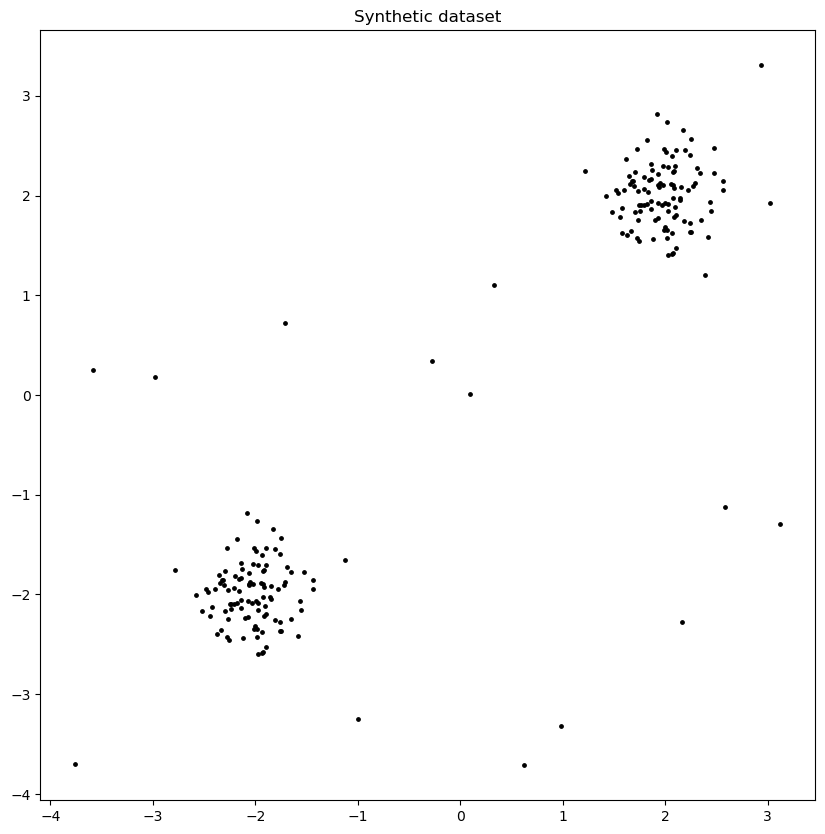

In [5]:
np.random.seed(42)

X_inliers = 0.3 * np.random.randn(100, 2)
X_inliers = np.r_[X_inliers + 2, X_inliers - 2]

X_outliers = np.random.uniform(low = -4, high = 4, size = (20, 2))
X = np.r_[X_inliers, X_outliers]

n_outliers = len(X_outliers)
ground_truth = np.ones(len(X), dtype = int)
ground_truth[-n_outliers:] = -1

plt.figure(figsize = (10, 10))
plt.title("Synthetic dataset")
plt.scatter(X[:, 0], X[:, 1], color = 'black', s = 6.)
plt.show()

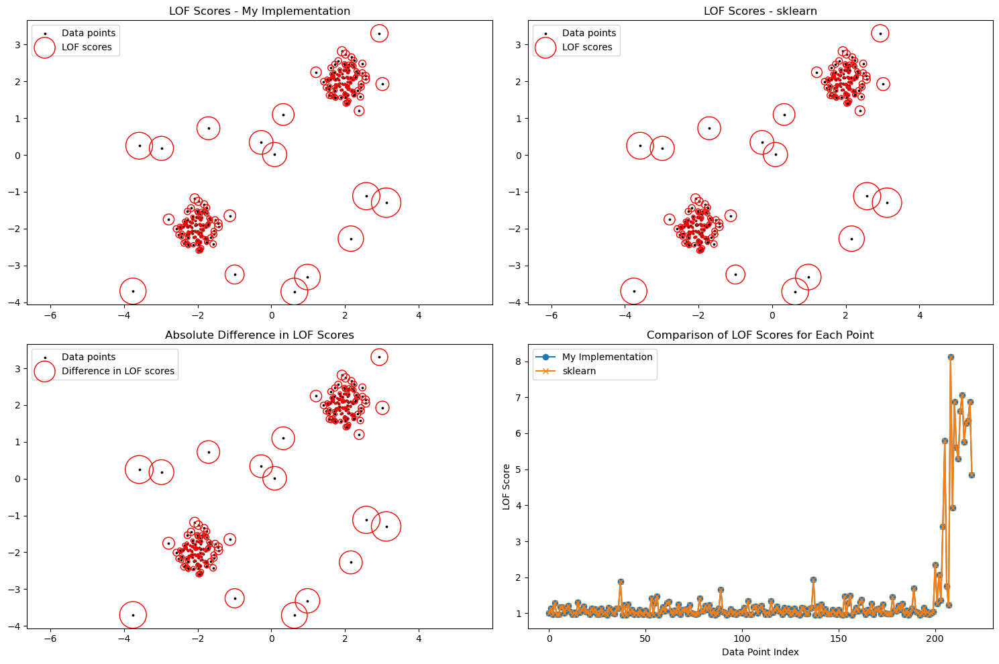

In [6]:
# Benchmark & Comparison
n_neighbors = 20

lof_manual = lof(X, n_neighbors = n_neighbors)
clf = LocalOutlierFactor(n_neighbors = n_neighbors, contamination = 0.1)
y_pred = clf.fit_predict(X)
lof_sklearn = -clf.negative_outlier_factor_

lof_difference = np.abs(lof_manual - lof_sklearn)

fig, axs = plt.subplots(2, 2, figsize = (15, 10))

axs[0, 0].set_title("LOF Scores - My Implementation")
radius_manual = (lof_manual - lof_manual.min()) / (lof_manual.max() - lof_manual.min())
axs[0, 0].scatter(X[:, 0], X[:, 1], color = 'black', s = 3., label = 'Data points')
axs[0, 0].scatter(X[:, 0], X[:, 1], s = 1000 * radius_manual, edgecolors = 'r', facecolors = 'none', label = 'LOF scores')
axs[0, 0].legend(loc = 'upper left')
axs[0, 0].axis('equal')

axs[0, 1].set_title("LOF Scores - sklearn")
radius_sklearn = (lof_sklearn - lof_sklearn.min()) / (lof_sklearn.max() - lof_sklearn.min())
axs[0, 1].scatter(X[:, 0], X[:, 1], color = 'black', s = 3., label = 'Data points')
axs[0, 1].scatter(X[:, 0], X[:, 1], s = 1000 * radius_sklearn, edgecolors = 'r', facecolors = 'none', label = 'LOF scores')
axs[0, 1].legend(loc = 'upper left')
axs[0, 1].axis('equal')

axs[1, 0].set_title("Absolute Difference in LOF Scores")
radius_difference = (lof_difference - lof_difference.min()) / (lof_difference.max() - lof_difference.min())
axs[1, 0].scatter(X[:, 0], X[:, 1], color = 'black', s = 3., label = 'Data points')
axs[1, 0].scatter(X[:, 0], X[:, 1], s = 1000 * radius_difference, edgecolors = 'r', facecolors = 'none', label = 'Difference in LOF scores')
axs[1, 0].legend(loc = 'upper left')
axs[1, 0].axis('equal')

axs[1, 1].set_title("Comparison of LOF Scores for Each Point")
axs[1, 1].plot(lof_manual, label = 'My Implementation', marker = 'o')
axs[1, 1].plot(lof_sklearn, label = 'sklearn', marker = 'x')
axs[1, 1].set_xlabel('Data Point Index')
axs[1, 1].set_ylabel('LOF Score')
axs[1, 1].legend()

plt.tight_layout()
plt.show()


---

### b

# Core strategy
- Compute IF index for each data point  
- Normalize IF index (range: 0-1) :  
$IF_{norm}(x_i) = \frac{IF(x_i) - IF_{min}}{IF_{max} - IF_{min}}$

- Modify reachability distance using IF-based weights :      
$w_{ij} = \frac{1}{1 + α × (IF_{norm}(x_i) + IF_{norm}(x_j))}$

Giving us this new formula :  
$r\_dist_{k}(x_i, x_j) = max\{k\_dist(x_j), dist(x_i, x_j)\} × w_{ij}$
- Compute local reachability density :  
$lrd_k(x_i) = \frac{\sum{x_j \in N_k(x_i)} r\_dist_k(x_i, x_j)}{|N_k(x_i)|}^{-1}$
- Compute modified LOF score given by previous formulas :  
$LOF_k(x_i) = \frac{\sum{x_j \in N_k(x_i)} lrd_k(x_j)}{|N_k(x_i)| × lrd_k(x_i)}$

# Results
High LOF+IF Score $=> x_i$ is anomalous both locally and globally meaning an outlier   
Low LOF+IF Score $=> x_i$ is likely normal in both contexts meaning an inlier

# Code

In [7]:
def lof_if(X, n_neighbors = 20, alpha = 1.0):
    """
    Compute LOF using IF index.
    
    Parameters:
    - X : Input data of shape (num_samples, num_features).
    - n_neighbors (int) : The number of neighbors LOF.
    - alpha (float) : Weight factor for IF into the LOF computation.
    
    Returns:
    - lof_scores : Modified LOF scores for each data point.
    - IF_norm : Normalized IF scores.
    """
    
    num_samples = X.shape[0]
    
    # Compute IF index
    iso_forest = IsolationForest(contamination = 'auto', random_state = 42)
    iso_forest.fit(X)
    IF_scores = -iso_forest.decision_function(X)
    
    # Normalize
    IF_min = IF_scores.min()
    IF_max = IF_scores.max()
    IF_norm = (IF_scores - IF_min) / (IF_max - IF_min)
    
    distances = pairwise_distances(X, metric = 'euclidean')
    
    # Identify neighbors
    k_distances = np.zeros(num_samples)
    neighbors = []
    
    for i in range(num_samples):
        sorted_indices = np.argsort(distances[i])
        sorted_distances = distances[i][sorted_indices]
        
        # Exclude distance 0 to itself
        sorted_indices = sorted_indices[sorted_indices != i]
        sorted_distances = sorted_distances[sorted_distances != 0]
        
        k_distance = sorted_distances[n_neighbors - 1]
        k_distances[i] = k_distance
        
        # Neighbors within k-distance
        neighbor_indices = sorted_indices[sorted_distances <= k_distance]
        neighbors.append(neighbor_indices)
    
    # Compute reachability distances
    reachability_distances = []
    for i in range(num_samples):
        reach_dist = []
        for j in neighbors[i]:
            # Compute a weight based on IF
            weight = 1 / (1 + alpha * (IF_norm[i] + IF_norm[j]))
            reach_dist.append(max(k_distances[j], distances[i][j]) * weight)
        reachability_distances.append(reach_dist)
    
    # Compute LRD
    lrd = np.zeros(num_samples)
    for i in range(num_samples):
        lrd[i] = len(neighbors[i]) / np.sum(reachability_distances[i])
    
    # Compute LOF scores
    lof_scores = np.zeros(num_samples)
    for i in range(num_samples):
        lrd_ratios = []
        for j in neighbors[i]:
            lrd_ratios.append(lrd[j] / lrd[i])
        lof_scores[i] = np.sum(lrd_ratios) / len(neighbors[i])
    
    return lof_scores, IF_norm


---

### c

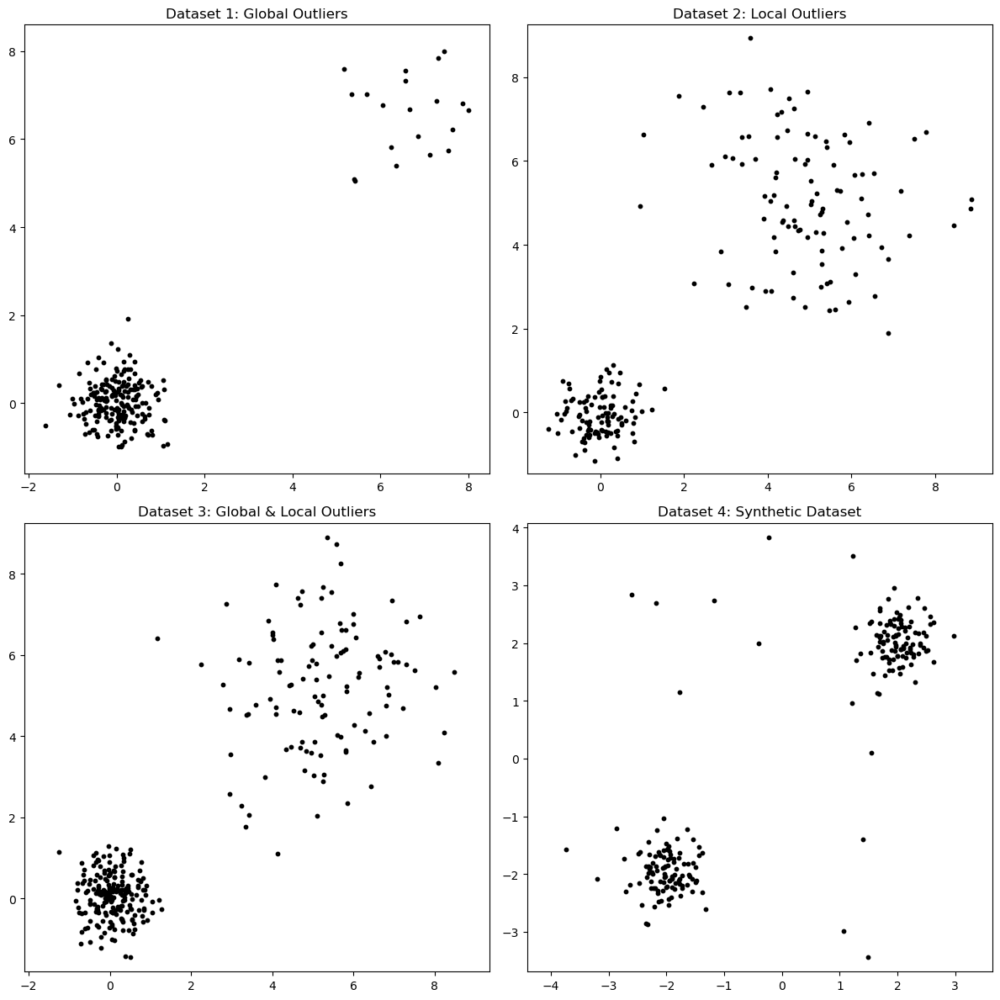

In [27]:
np.random.seed(42)

# Dataset 1: Global Outliers
X1_inliers = 0.5 * np.random.randn(200, 2)
X1_outliers = np.random.uniform(low=5, high=8, size=(20, 2))
X1 = np.vstack((X1_inliers, X1_outliers))

# Dataset 2: Local Outliers
X2_inliers = 0.5 * np.random.randn(100, 2)
X2_inliers_sparse = 1.5 * np.random.randn(100, 2) + [5, 5]
X2_outliers = 0.5 * np.random.randn(5, 2) + [0, 0]
X2 = np.vstack((X2_inliers, X2_inliers_sparse, X2_outliers))

# Dataset 3: Global & Local Outliers
X3_inliers = 0.5 * np.random.randn(200, 2)
X3_outliers_global = np.random.uniform(low=5, high=8, size=(10, 2))
X3_inliers_sparse = 1.5 * np.random.randn(100, 2) + [5, 5]
X3_outliers_local = 1.5 * np.random.randn(5, 2) + [5, 5]
X3 = np.vstack((X3_inliers, X3_inliers_sparse, X3_outliers_global, X3_outliers_local))

# Dataset 4: Synthetic Dataset
X4_inliers = 0.3 * np.random.randn(100, 2)
X4_inliers = np.r_[X4_inliers + 2, X4_inliers - 2]
X4_outliers = np.random.uniform(low=-4, high=4, size=(20, 2))
X4 = np.r_[X4_inliers, X4_outliers]

def plot_dataset_subplot(ax, X, title):
    ax.scatter(X[:, 0], X[:, 1], s=10, color='k')
    ax.set_title(title)
    ax.axis('equal')

fig, axes = plt.subplots(2, 2, figsize=(12, 12))
axes = axes.flatten()

plot_dataset_subplot(axes[0], X1, "Dataset 1: Global Outliers")
plot_dataset_subplot(axes[1], X2, "Dataset 2: Local Outliers")
plot_dataset_subplot(axes[2], X3, "Dataset 3: Global & Local Outliers")
plot_dataset_subplot(axes[3], X4, "Dataset 4: Synthetic Dataset")

plt.tight_layout()
plt.show()

In [25]:
def lof_sklearn(X, n_neighbors = 20):
    clf = LocalOutlierFactor(n_neighbors = n_neighbors, contamination = 'auto')
    clf.fit(X)
    lof_scores = -clf.negative_outlier_factor_
    return lof_scores

def IF(X):
    clf = IsolationForest(contamination = 'auto', random_state = 42)
    clf.fit(X)
    if_scores = -clf.decision_function(X)
    return if_scores




--- Dataset 1 ---


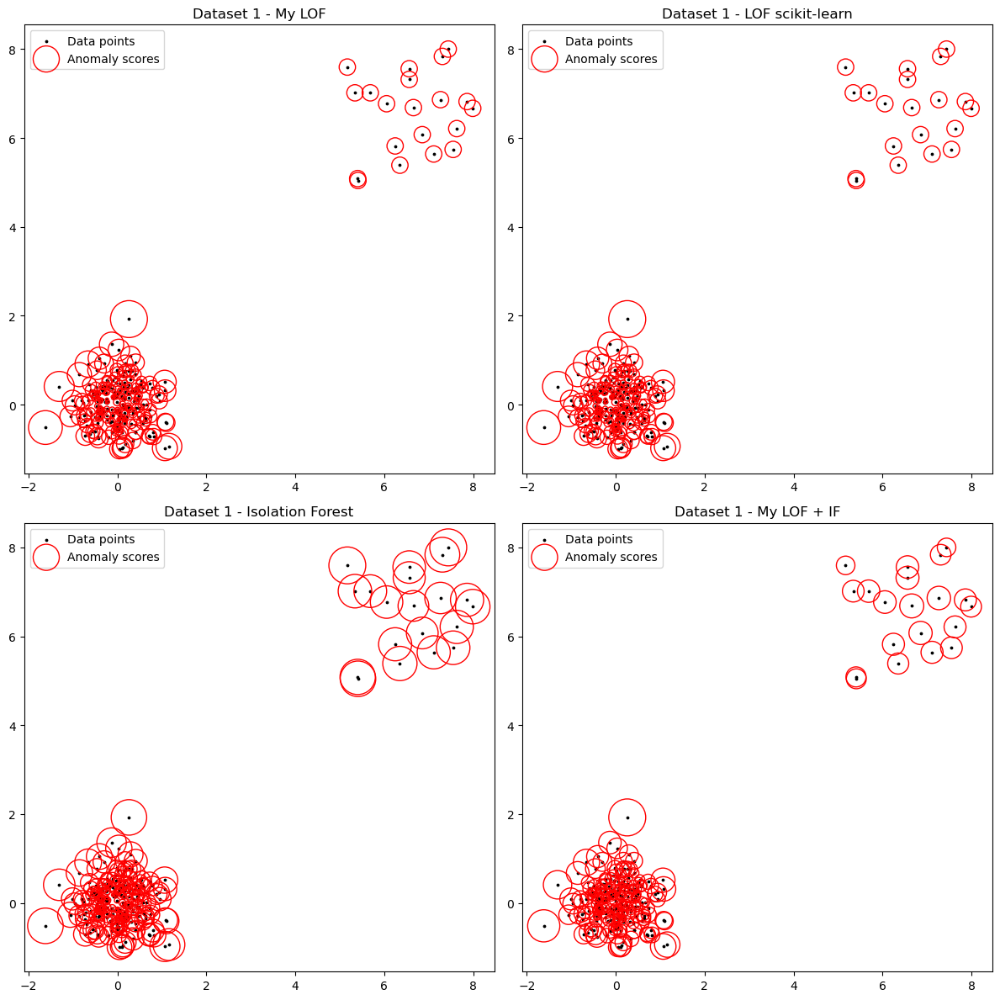




--- Dataset 2 ---


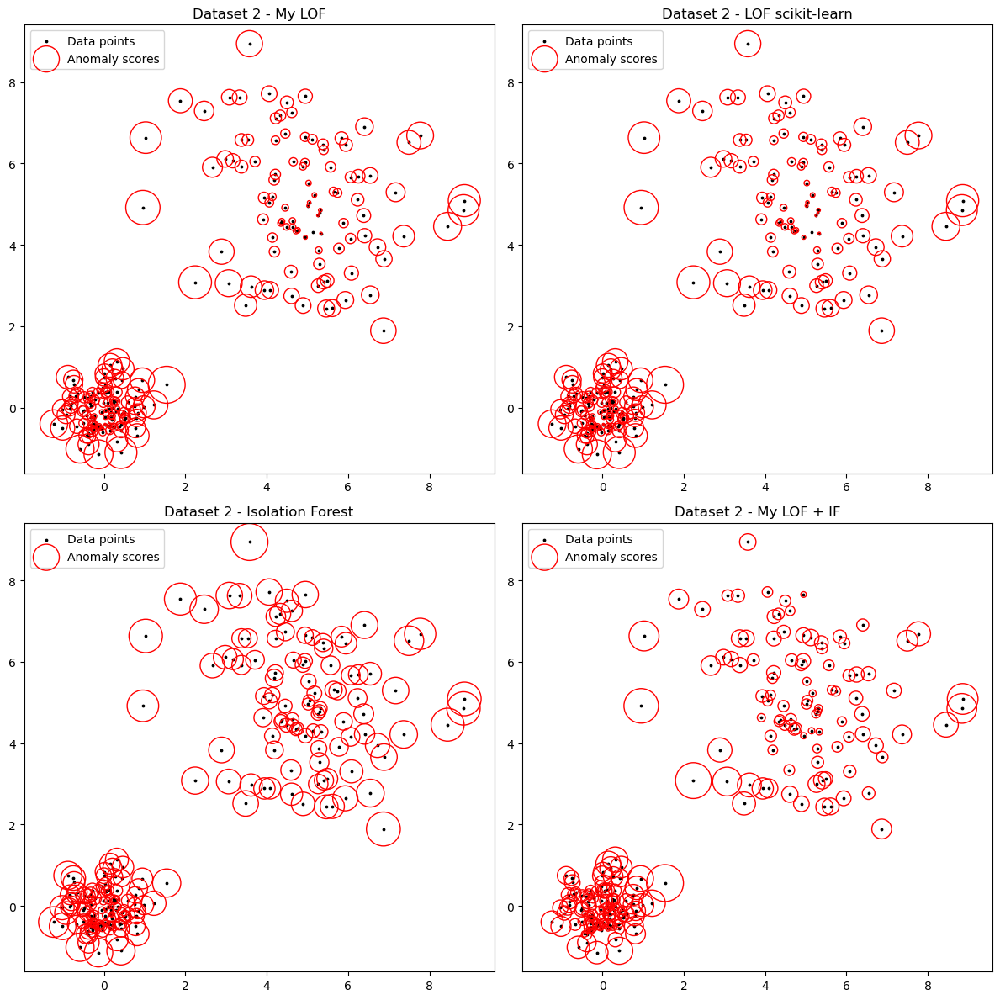




--- Dataset 3 ---


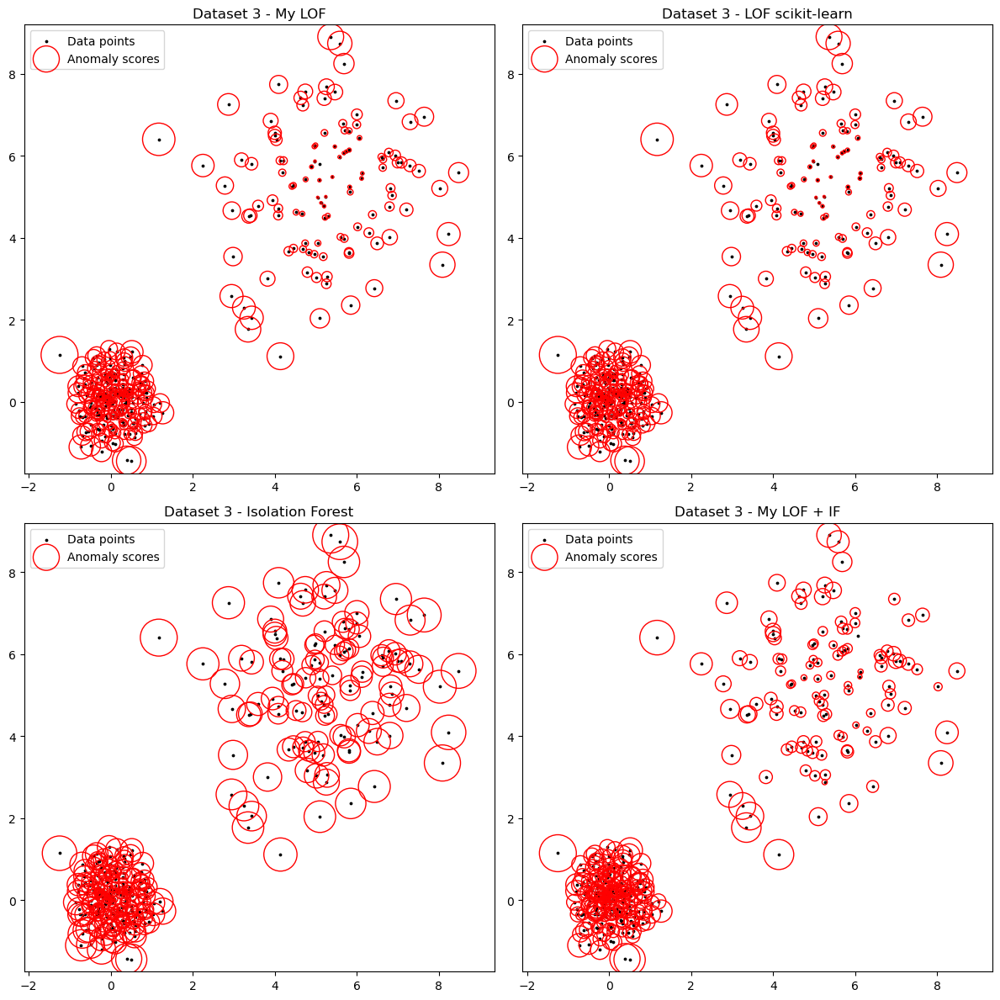




--- Dataset 4 ---


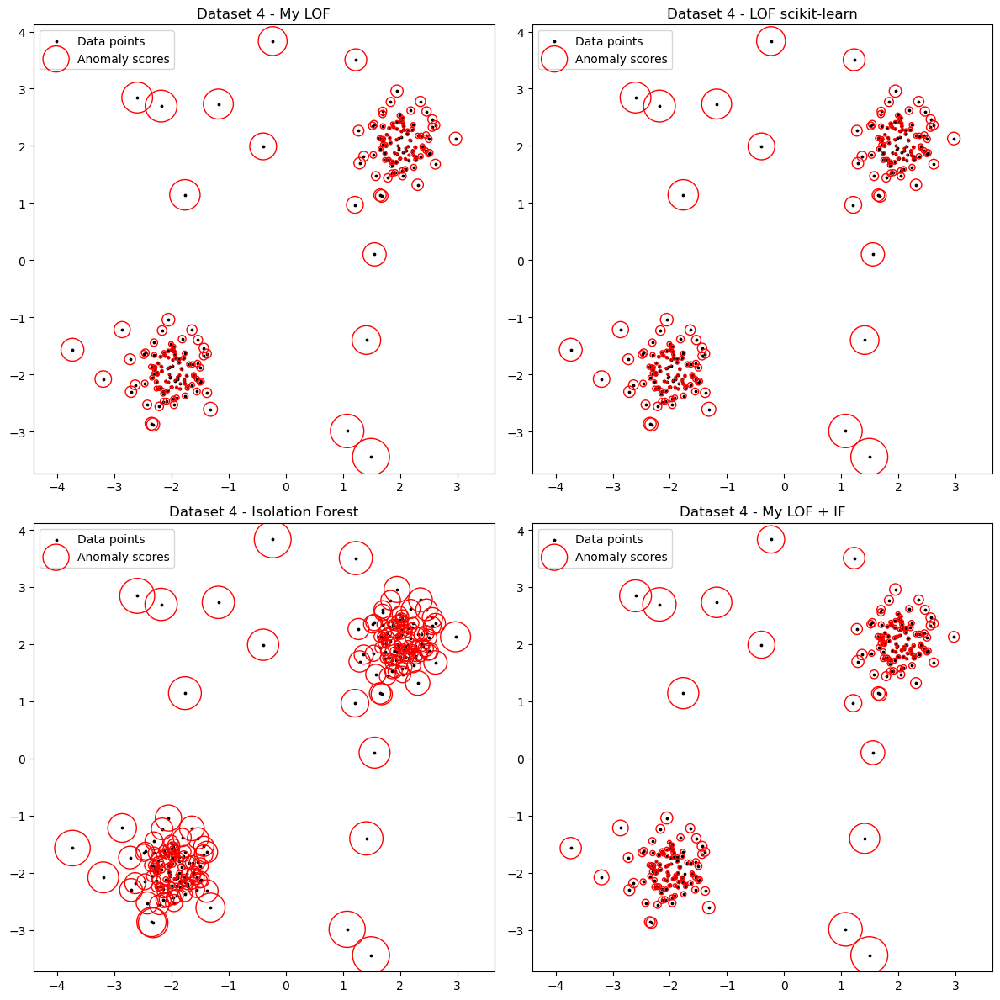

In [26]:
def plot_scores(ax, X, scores, title):
    radius = (scores - scores.min()) / (scores.max() - scores.min())
    ax.scatter(X[:, 0], X[:, 1], color = 'k', s = 3., label = 'Data points')
    ax.scatter(X[:, 0], X[:, 1], s = 1000 * radius, edgecolors = 'r',
               facecolors = 'none', label = "Anomaly scores")
    ax.set_title(title)
    ax.axis('equal')
    ax.legend(loc = 'upper left')

datasets = [(X1, "Dataset 1"), (X2, "Dataset 2"), (X3, "Dataset 3"), (X4, "Dataset 4")]

for X, name in datasets:
    print(f"\n\n\n--- {name} ---")
    # Compute the anomaly scores
    lof_manual_scores = lof(X)
    lof_sklearn_scores = lof_sklearn(X)
    if_scores = IF(X)
    lof_modified_scores, IF_norm = lof_if(X)

    fig, axes = plt.subplots(2, 2, figsize = (12, 12))
    axes = axes.flatten()

    # Plot the scores on the subplots
    plot_scores(axes[0], X, lof_manual_scores, f"{name} - My LOF")
    plot_scores(axes[1], X, lof_sklearn_scores, f"{name} - LOF scikit-learn")
    plot_scores(axes[2], X, if_scores, f"{name} - Isolation Forest")
    plot_scores(axes[3], X, lof_modified_scores, f"{name} - My LOF + IF")

    plt.tight_layout()
    plt.show()


---
---

## Exercise 4 [45%]

### a

#### Greedy k-mean

In [9]:
def greedy_global_kmeans(X, k_max, max_iter = 100, tol = 1e-4):
    """
    Greedy Global K-Means algorithm.

    Parameters:
    - X : Input data (num_samples x num_features).
    - k_max (int) : Maximum number of clusters to compute.
    - max_iter (int) : Maximum number of iterations for the KMeans algorithm.
    - tol (float) : Tolerance for convergence for the KMeans algorithm.

    Returns:
    - labels : Cluster assignments for each data point.
    - centroids : Final centroids of the clusters.
    """
    n_samples, n_features = X.shape
    # Start with one centroid at the mean of the data
    centroids = [np.mean(X, axis = 0)]
    
    for k in range(1, k_max):
        best_error = np.inf
        best_centroids = None
        best_labels = None

        for i in range(n_samples):
            # Initialize centroids with existing centroids plus candidate
            init_centroids = np.vstack([centroids, X[i]])
            # Initialize KMeans with said centroids
            kmeans = KMeans(n_clusters = k + 1, init = init_centroids, n_init = 1, max_iter = max_iter, tol = tol)
            kmeans.fit(X)
            error = kmeans.inertia_
            if error < best_error:
                best_error = error
                best_centroids = kmeans.cluster_centers_
                best_labels = kmeans.labels_

        # Update centroids
        centroids = best_centroids

    # Final KMeans with the best centroids
    kmeans = KMeans(n_clusters = k_max, init = centroids, n_init = 1, max_iter = max_iter, tol = tol)
    kmeans.fit(X)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_

    return labels, centroids

#### Fast Global k-mean

In [7]:
def fast_global_kmeans(X, k_max, max_iter = 100, tol = 1e-4):
    """
    Fast Global K-Means algorithm.

    Parameters:
    - X : Input data (num_samples x num_features).
    - k_max (int) : Maximum number of clusters to compute.
    - max_iter (int) : Maximum number of iterations for the KMeans algorithm.
    - tol (float) : Tolerance for convergence for the KMeans algorithm.

    Returns:
    - labels : Cluster assignments for each data point.
    - centroids : Final centroids of the clusters.
    """
    n_samples, n_features = X.shape
    # Start with one centroid at the mean of the data
    centroids = [np.mean(X, axis = 0)]

    for k in range(1, k_max):
        best_error = np.inf
        best_centroids = None

        for i in range(n_samples):
            # Initialize centroids with existing centroids plus candidate
            init_centroids = np.vstack([centroids, X[i]])
            # One iteration of KMeans
            kmeans = KMeans(n_clusters = k + 1, init = init_centroids, n_init = 1, max_iter = 1, tol = tol)
            kmeans.fit(X)
            error = kmeans.inertia_
            if error < best_error:
                best_error = error
                best_centroids = kmeans.cluster_centers_

        # Refine centroids with full KMeans
        kmeans = KMeans(n_clusters = k + 1, init = best_centroids, n_init = 1, max_iter = max_iter, tol = tol)
        kmeans.fit(X)
        centroids = kmeans.cluster_centers_

    labels = kmeans.labels_

    return labels, centroids

#### Global ++ k-mean

In [8]:
def global_kmeans(X, k_max, m = None, max_iter = 100, tol = 1e-4):
    """
    Global++ K-Means algorithm.

    Parameters:
    - X : Input data (num_samples x num_features).
    - k_max (int) : Maximum number of clusters to compute.
    - m (int) : Number of centroid candidates to sample in each iteration.
    - max_iter (int) : Maximum number of iterations for the KMeans algorithm.
    - tol (float) : Tolerance for convergence for the KMeans algorithm.

    Returns:
    - labels : Cluster assignments for each data point.
    - centroids : Final centroids of the clusters.
    """
    n_samples, n_features = X.shape
    if m is None:
        m = max(1, n_samples // 10)

    # Start with one centroid initialized at the mean of the data
    centroids = [np.mean(X, axis = 0)]

    for k in range(1, k_max):
        # Compute squared distances to nearest centroid
        distances = np.min(cdist(X, centroids, 'sqeuclidean'), axis = 1)
        total_distance = np.sum(distances)
        probabilities = distances / total_distance

        best_error = np.inf
        best_centroids = None

        for _ in range(m):
            # Select a new centroid based on probabilities
            idx = np.random.choice(n_samples, p = probabilities)
            init_centroids = np.vstack([centroids, X[idx]])
            # Run KMeans with said centroids
            kmeans = KMeans(n_clusters = k + 1, init = init_centroids, n_init = 1, max_iter = max_iter, tol = tol)
            kmeans.fit(X)
            error = kmeans.inertia_
            if error < best_error:
                best_error = error
                best_centroids = kmeans.cluster_centers_

        # Update centroids with the best
        centroids = best_centroids

    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_

    return labels, centroids

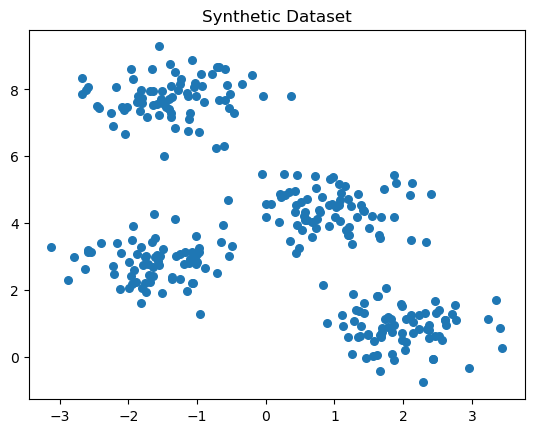

In [10]:
np.random.seed(42)
X, y_true = make_blobs(n_samples = 300, centers = 4, cluster_std = 0.60, random_state = 0)

plt.scatter(X[:, 0], X[:, 1], s = 30)
plt.title("Synthetic Dataset")
plt.show()

In [17]:
k_max = 15


labels_greedy, centroids_greedy = greedy_global_kmeans(X, k_max)


labels_fast, centroids_fast = fast_global_kmeans(X, k_max)

labels_globalpp, centroids_globalpp = global_kmeans(X, k_max)

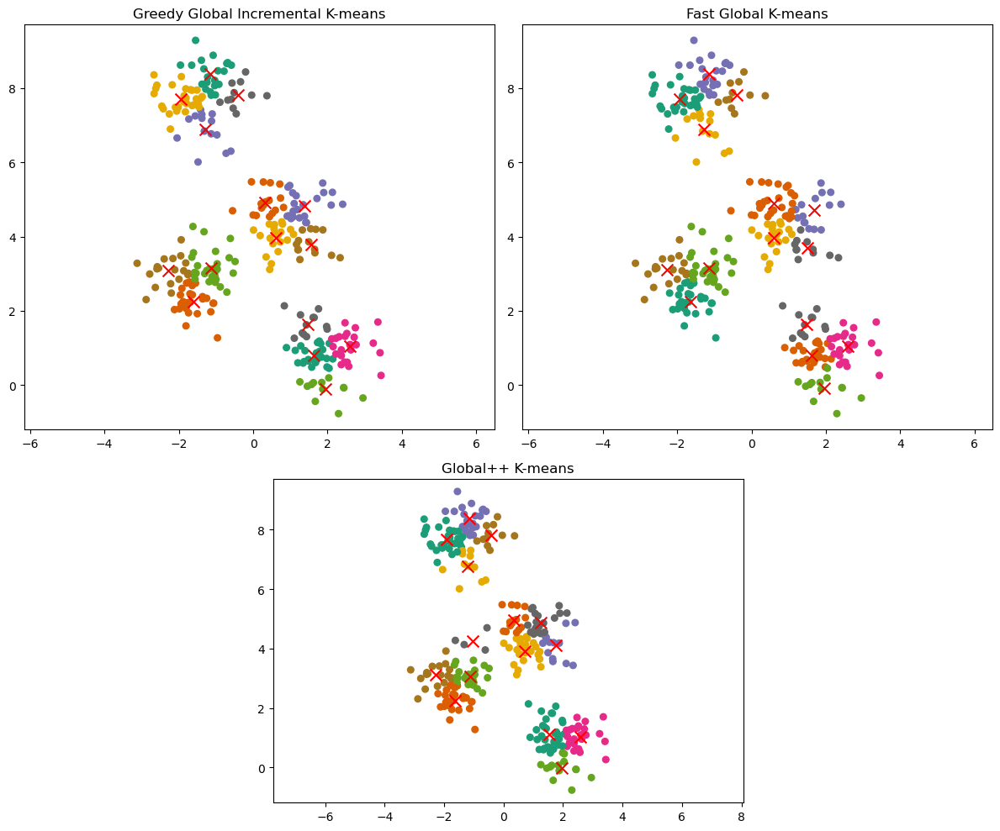

In [18]:
def plot_clusters(ax, X, labels, centroids, title):
    ax.scatter(X[:, 0], X[:, 1], c = labels, cmap = 'Dark2', s = 30)
    ax.scatter(centroids[:, 0], centroids[:, 1], c = 'red', marker = 'x', s = 100)
    ax.set_title(title)
    ax.axis('equal')

fig = plt.figure(figsize = (12, 10))
gs = GridSpec(2, 4, height_ratios = [1, 0.8], width_ratios = [1, 1, 1, 1])

ax1 = fig.add_subplot(gs[0, 0:2])
ax2 = fig.add_subplot(gs[0, 2:4])
ax3 = fig.add_subplot(gs[1, 1:3])

plot_clusters(ax1, X, labels_greedy, centroids_greedy, "Greedy Global Incremental K-means")
plot_clusters(ax2, X, labels_fast, centroids_fast, "Fast Global K-means")
plot_clusters(ax3, X, labels_globalpp, centroids_globalpp, "Global++ K-means")

plt.tight_layout()
plt.show()


---

### b

The property that no longer holds with Step B3 is **centroid stability**: without B3, the centroids of clusters not involved in the split remained unchanged. With B3, which performs a full (k+1)-means, all centroids can be modified to minimize the global error.

Comparing with the global incremental approach, we observe the same lack of centroid stability: in both cases, all existing centroids can be updated at each iteration to optimize the global clustering.


---

### c

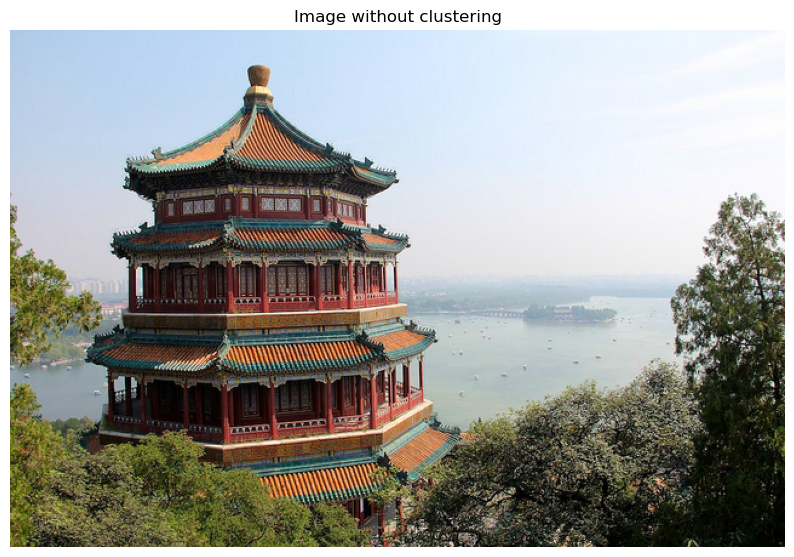

In [19]:
n_colors = 64

china = load_sample_image("china.jpg")
china = np.array(china, dtype=np.float64) / 255
w, h, d = original_shape = tuple(china.shape)
assert d == 3 

image_array = np.reshape(china, (w * h, d))

plt.figure(figsize = (10, 10))
plt.axis('off')
plt.title('Image without clustering')
plt.imshow(china)
plt.show()

In [20]:
print("Fitting model on a small sub-sample of the data")
t0 = time()
image_array_sample = shuffle(image_array, random_state = 0)[:1000]
print(f"Sample size: {image_array_sample.shape[0]} pixels")

Fitting model on a small sub-sample of the data
Sample size: 1000 pixels


In [21]:
print("Applying Greedy Global K-means")
t0 = time()
# Use centroids from sample as initial centroids
labels_sample, centroids_sample = greedy_global_kmeans(image_array_sample, k_max)

# Use the centroids obtained to cluster the full image
kmeans = KMeans(n_clusters = k_max, init = centroids_sample, n_init = 1)
kmeans.fit(image_array)
labels_greedy = kmeans.labels_
centroids_greedy = kmeans.cluster_centers_

print(f"Greedy Global K-means completed in {time() - t0:.3f}s.")

Applying Greedy Global K-means
Greedy Global K-means completed in 115.768s.


In [22]:
print("Applying Global++ K-means")
t0 = time()

m = 10  

# we can initialize centroids using the sample
labels_sample, centroids_sample = global_kmeans(image_array_sample, k_max, m = m)

# Use the centroids obtained to cluster the full image
kmeans = KMeans(n_clusters = k_max, init = centroids_sample, n_init = 1)
kmeans.fit(image_array)
labels_globalpp = kmeans.labels_
centroids_globalpp = kmeans.cluster_centers_

print(f"Global++ K-means completed in {time() - t0:.3f}s.")

Applying Global++ K-means
Global++ K-means completed in 1.566s.


In [23]:
print("Applying Fast Global K-means")
t0 = time()
labels_sample, centroids_sample = fast_global_kmeans(image_array_sample, k_max)

# Use the centroids obtained to cluster the full image
kmeans = KMeans(n_clusters = k_max, init = centroids_sample, n_init = 1)
kmeans.fit(image_array)
labels_fast = kmeans.labels_
centroids_fast = kmeans.cluster_centers_

print(f"Fast Global K-means completed in {time() - t0:.3f}s.")

Applying Fast Global K-means
Fast Global K-means completed in 69.804s.


In [24]:
print("Applying Standard K-means from scikit-learn")
t0 = time()
kmeans = KMeans(n_clusters = n_colors, random_state = 0).fit(image_array_sample)
print(f"K-means fitting done in {time() - t0:.3f}s.")

# Predict labels for the full image
t0 = time()
labels_kmeans = kmeans.predict(image_array)
print(f"K-means prediction done in {time() - t0:.3f}s.")

Applying Standard K-means from scikit-learn


/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


K-means fitting done in 0.296s.
K-means prediction done in 0.038s.


In [25]:
# Random codebook
codebook_random = shuffle(image_array, random_state = 0)[:n_colors]
print("Predicting color indices on the full image (Random Sampling)")
t0 = time()
labels_random = pairwise_distances_argmin(image_array, codebook_random)
print(f"Random sampling prediction done in {time() - t0:.3f}s.")

Predicting color indices on the full image (Random Sampling)
Random sampling prediction done in 0.018s.


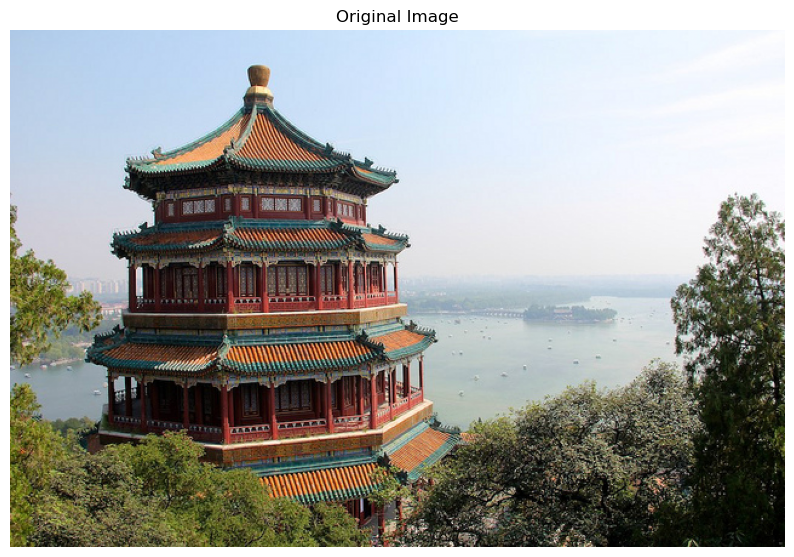

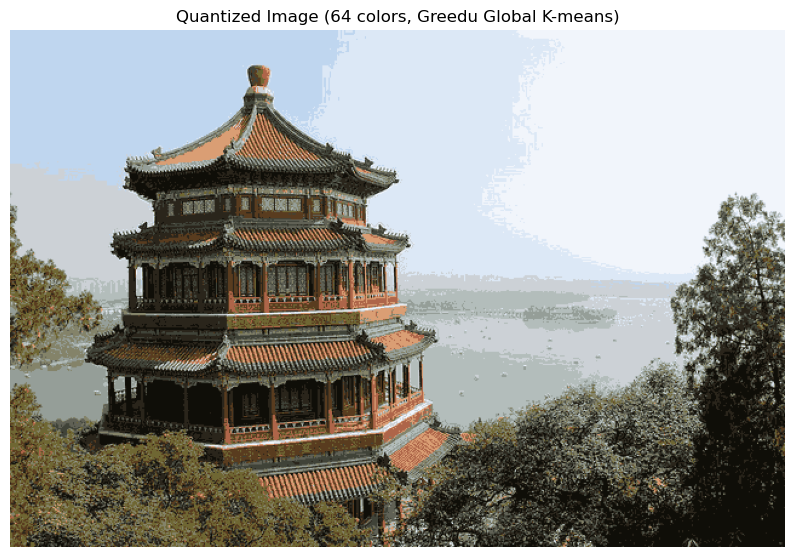

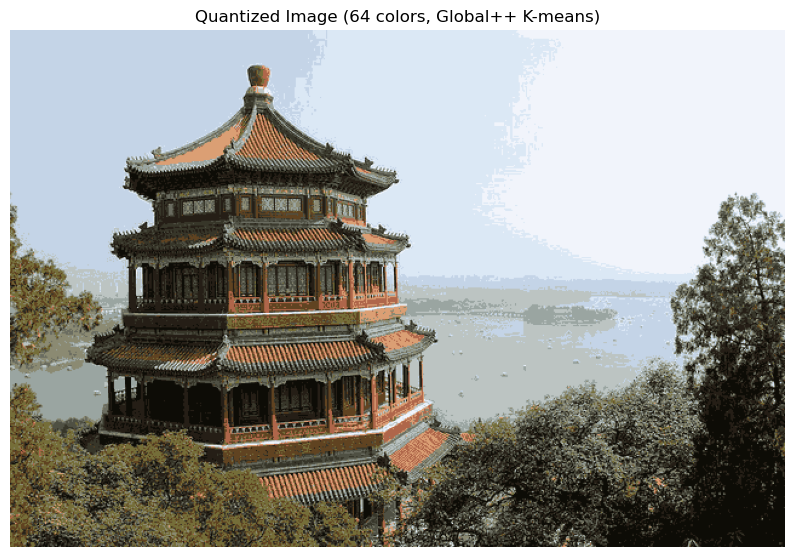

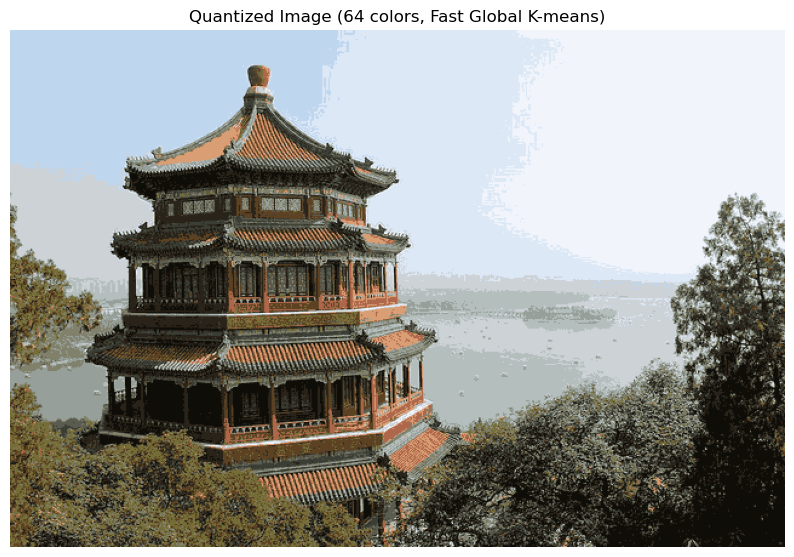

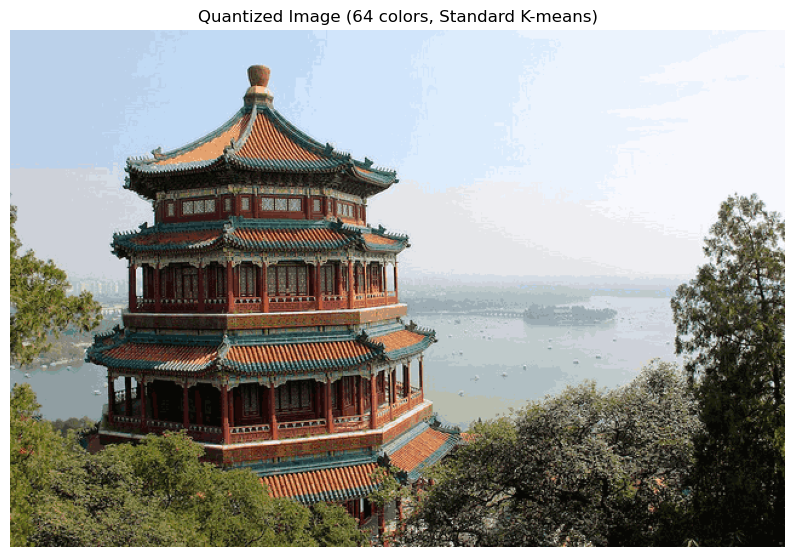

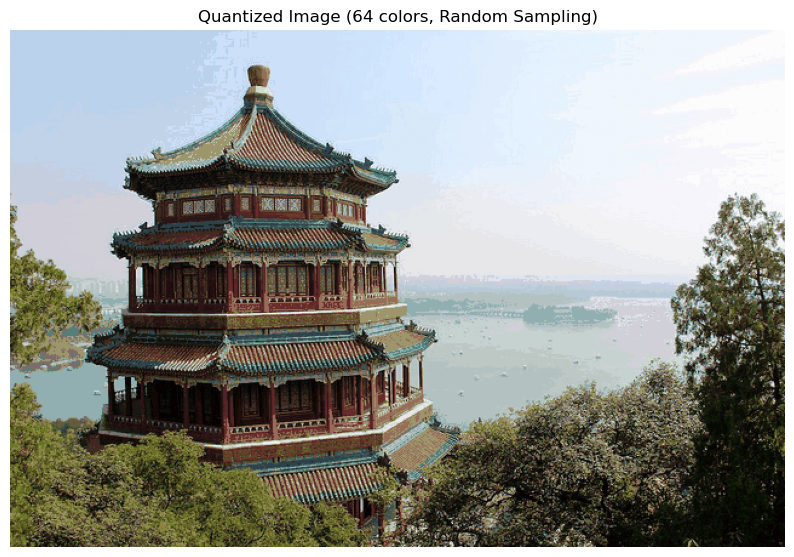

In [26]:
def recreate_image(codebook, labels, w, h):
    """Recreate the (compressed) image from the codebook & labels"""
    return codebook[labels].reshape(w, h, -1)

plt.figure(figsize = (10, 10))
plt.axis('off')
plt.title('Original Image')
plt.imshow(china)
plt.show()

plt.figure(figsize = (10, 10))
plt.axis('off')
plt.title('Quantized Image (64 colors, Greedy Global K-means)')
image_greedy = recreate_image(centroids_greedy, labels_greedy, w, h)
plt.imshow(image_greedy)
plt.show()

plt.figure(figsize = (10, 10))
plt.axis('off')
plt.title('Quantized Image (64 colors, Global++ K-means)')
image_globalpp = recreate_image(centroids_globalpp, labels_globalpp, w, h)
plt.imshow(image_globalpp)
plt.show()

plt.figure(figsize = (10, 10))
plt.axis('off')
plt.title('Quantized Image (64 colors, Fast Global K-means)')
image_fast = recreate_image(centroids_fast, labels_fast, w, h)
plt.imshow(image_fast)
plt.show()

plt.figure(figsize = (10, 10))
plt.axis('off')
plt.title('Quantized Image (64 colors, Standard K-means)')
image_kmeans = recreate_image(kmeans.cluster_centers_, labels_kmeans, w, h)
plt.imshow(image_kmeans)
plt.show()

plt.figure(figsize = (10, 10))
plt.axis('off')
plt.title('Quantized Image (64 colors, Random Sampling)')
image_random = recreate_image(codebook_random, labels_random, w, h)
plt.imshow(image_random)
plt.show()


---

### d

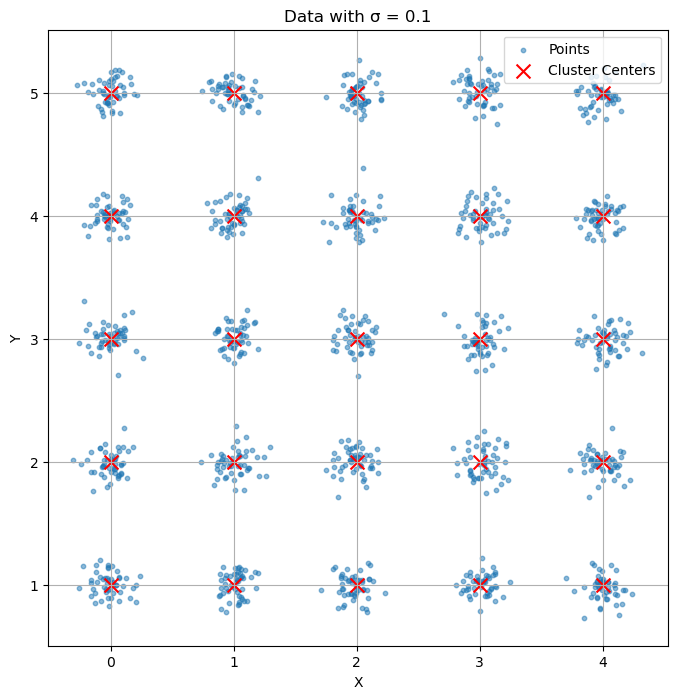

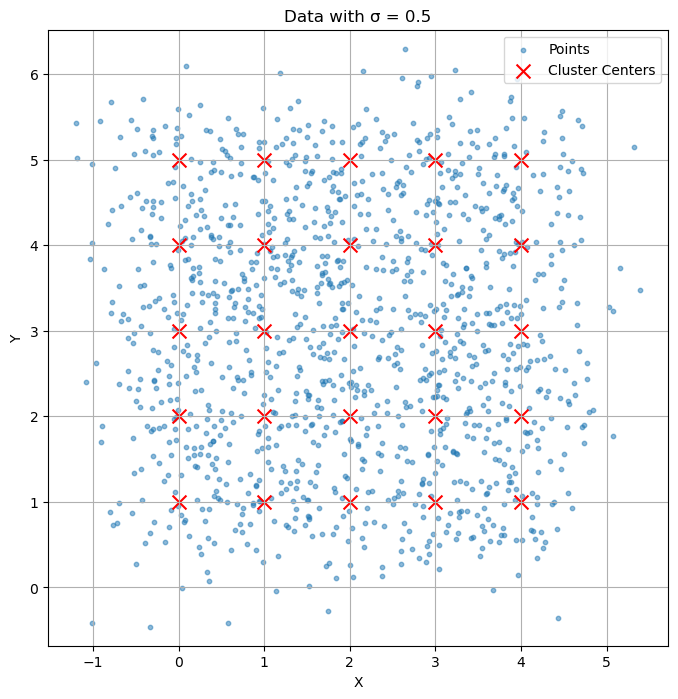

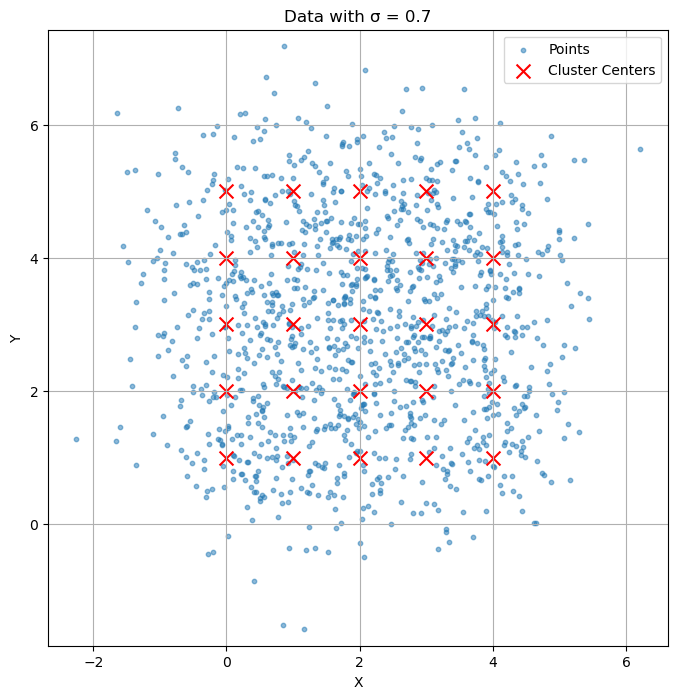

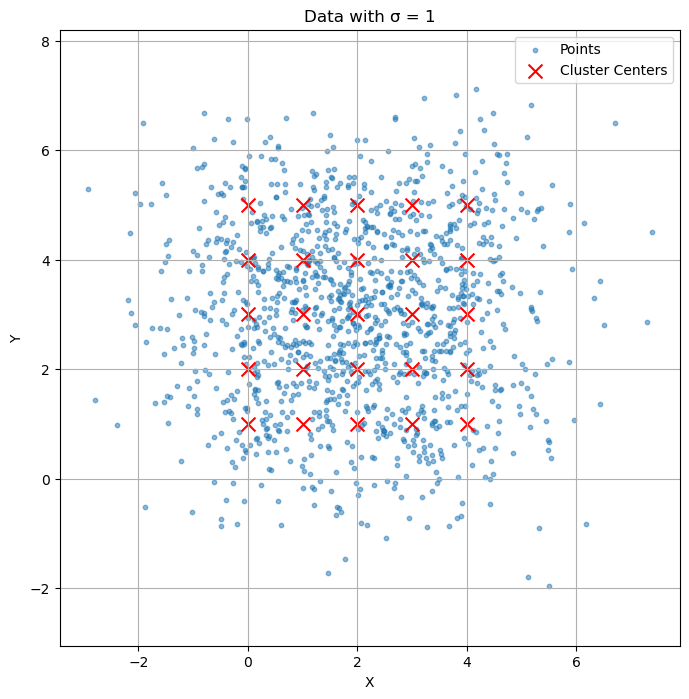

In [28]:
def generate_synthetic_data(sigma):
    """
    Synthetic dataset on a 5x5 grid.
    
    Parameters:
    - sigma (float): Standard deviation of the points around each cluster center.

    Returns:
    - data (numpy array): Generated points (shape: [num_points, 2]).
    - cluster_centers (numpy array): Coordinates of the cluster centers (shape: [25, 2]).
    """
    N = 50
    cluster_centers = []
    data = []

    for x in range(5):
        for y in range(5):
            center = np.array([x, 5 - y])
            cluster_centers.append(center)
            
            points = np.random.randn(N, 2) * sigma + center
            data.append(points)

    data = np.vstack(data)
    return data, np.array(cluster_centers)

sigmas = [0.1, 0.5, 0.7, 1]

for sigma in sigmas:
    data, cluster_centers = generate_synthetic_data(sigma)
    plt.figure(figsize = (8, 8))
    plt.scatter(data[:, 0], data[:, 1], s = 10, alpha = 0.5, label = 'Points')
    plt.scatter(cluster_centers[:, 0], cluster_centers[:, 1], c = 'red', marker = 'x', s = 100, label = 'Cluster Centers')
    plt.title(f'Data with σ = {sigma}')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.axis('equal')
    plt.grid(True)
    plt.legend()
    plt.show()

In [14]:
def flat_gmm_clustering(data, n_components):
    gmm = GaussianMixture(n_components = n_components, random_state = 42)
    gmm.fit(data)
    labels = gmm.predict(data)
    return labels, gmm

In [15]:
def bisecting_gmm_clustering(data, n_components):
    """
    Bisecting GMM approach.

    Parameters:
    - data (numpy array): Input data (shape: [num_samples, num_features]).
    - n_components (int): Desired number of final components.

    Returns:
    - labels (numpy array): Cluster labels assigned to each data point.
    - gmm (GaussianMixture): The fitted GMM model.
    """
    current_components = 1  
    gmm = GaussianMixture(n_components = current_components, random_state = 42)
    gmm.fit(data)

    while current_components < n_components:
        # Largest covariance determinant
        covariances = gmm.covariances_
        component_to_split = np.argmax(np.linalg.det(covariances))

        # Extract parameters 
        mean_to_split = gmm.means_[component_to_split]
        covariance_to_split = covariances[component_to_split]

        # Create two new components
        epsilon = 0.01  # Small perturbation
        new_mean1 = mean_to_split + epsilon
        new_mean2 = mean_to_split - epsilon

        # Update the means 
        new_means = np.delete(gmm.means_, component_to_split, axis = 0)
        new_means = np.vstack([new_means, new_mean1, new_mean2])

        # Update the weights 
        new_weights = np.delete(gmm.weights_, component_to_split)
        weight_to_split = gmm.weights_[component_to_split]
        new_weights = np.hstack([new_weights, weight_to_split / 2, weight_to_split / 2])

        # Update the covariances
        new_covariances = np.delete(gmm.covariances_, component_to_split, axis = 0)
        covariance_to_split_reshaped = covariance_to_split[np.newaxis, :, :] 
        new_covariances = np.vstack([new_covariances, covariance_to_split_reshaped, covariance_to_split_reshaped])

        # Compute precisions 
        new_precisions = np.array([np.linalg.inv(cov) for cov in new_covariances])

        # Fit the new GMM 
        current_components += 1
        gmm = GaussianMixture(n_components = current_components, random_state = 42,
                              covariance_type = 'full',
                              weights_init = new_weights,
                              means_init = new_means,
                              precisions_init = new_precisions)
        gmm.fit(data)

    # Assign cluster labels based on the final GMM
    labels = gmm.predict(data)
    return labels, gmm

In [16]:
def global_incremental_gmm_clustering(data, n_components, n_candidates = 100):
    """
    Incremental GMM approach.

    Parameters:
    - data (numpy array): Input data (shape: [num_samples, num_features]).
    - n_components (int): Desired number of final components.
    - n_candidates (int): Number of candidate points to consider for adding new components.

    Returns:
    - labels (numpy array): Cluster labels assigned to each data point.
    - gmm (GaussianMixture): The fitted GMM model.
    """
    current_components = 1 
    gmm = GaussianMixture(n_components = current_components, random_state = 42)
    gmm.fit(data)

    while current_components < n_components:
        best_gmm = None  # To store the best GMM model
        lowest_bic = np.inf 

        # Randomly sample a subset of candidate points for new components
        candidate_indices = np.random.choice(len(data), size = n_candidates, replace = False)

        for i in candidate_indices:
            # Update the means with the candidate point as a new mean
            new_means = np.vstack([gmm.means_, data[i].reshape(1, -1)])

            # Adjust the weights
            new_weights = np.hstack([
                gmm.weights_ * (current_components / (current_components + 1)), 
                1 / (current_components + 1)
            ])

            # Update covariances
            global_covariance = np.cov(data.T)[np.newaxis, :, :]  
            new_covariances = np.vstack([gmm.covariances_, global_covariance]) 

            # Compute precisions 
            new_precisions = np.array([np.linalg.inv(cov) for cov in new_covariances])

            # New GMM
            temp_gmm = GaussianMixture(
                n_components = current_components + 1,
                covariance_type = 'full',
                random_state = 42,
                weights_init = new_weights,
                means_init = new_means,
                precisions_init = new_precisions
            )
            temp_gmm.fit(data)

            # Evaluate the BIC to find the best model
            bic = temp_gmm.bic(data)
            if bic < lowest_bic:
                lowest_bic = bic
                best_gmm = temp_gmm

        # Update the GMM with the best model
        gmm = best_gmm
        current_components += 1

    # Return cluster labels and the final GMM
    labels = gmm.predict(data)
    return labels, gmm

In [17]:
def compute_clustering_error(gmm, data):
    """
    Computes the negative log-likelihood.

    Parameters:
    - gmm : The fitted GMM model.
    - data (numpy array): Input data (shape: [num_samples, num_features]).

    Returns:
    - nll (float): Average negative log-likelihood, representing the clustering error.
    """
    nll = -gmm.score(data)
    return nll

def compute_mse(gmm, data, true_centers):
    """
    Computes the Mean Squared Error.

    Parameters:
    - gmm : The fitted GMM model.
    - data (numpy array): Input data (shape: [num_samples, num_features]).
    - true_centers (numpy array): True cluster centers (shape: [num_clusters, num_features]).

    Returns:
    - mse (float): Mean Squared Error.
    """
    predicted_centers = gmm.means_  # Extract cluster centers from the GMM
    mse = np.mean(np.min(np.linalg.norm(true_centers[:, np.newaxis] - predicted_centers, axis=2), axis=1)**2)
    return mse

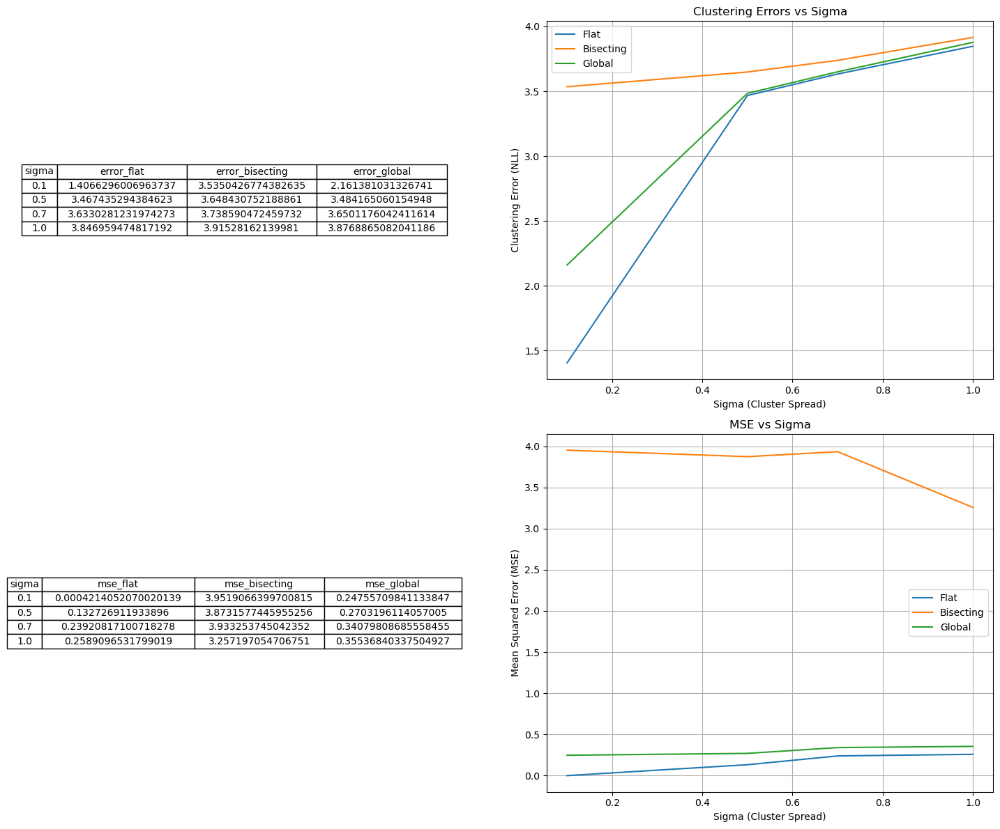

In [18]:
sigmas = [0.1, 0.5, 0.7, 1]  # sigma tested
results = []
mse_results = []

for sigma in sigmas:
    data, cluster_centers = generate_synthetic_data(sigma)
    n_components = 25

    # Flat GMM
    labels_flat, gmm_flat = flat_gmm_clustering(data, n_components)
    error_flat = compute_clustering_error(gmm_flat, data)
    mse_flat = compute_mse(gmm_flat, data, cluster_centers)

    # Bisecting GMM
    labels_bisect, gmm_bisect = bisecting_gmm_clustering(data, n_components)
    error_bisect = compute_clustering_error(gmm_bisect, data)
    mse_bisect = compute_mse(gmm_bisect, data, cluster_centers)

    # Global Incremental GMM
    labels_global, gmm_global = global_incremental_gmm_clustering(data, n_components, n_candidates=20)
    error_global = compute_clustering_error(gmm_global, data)
    mse_global = compute_mse(gmm_global, data, cluster_centers)

    results.append({
        'sigma': sigma,
        'error_flat': error_flat,
        'error_bisecting': error_bisect,
        'error_global': error_global
    })

    mse_results.append({
        'sigma': sigma,
        'mse_flat': mse_flat,
        'mse_bisecting': mse_bisect,
        'mse_global': mse_global
    })

results_df = pd.DataFrame(results)
mse_results_df = pd.DataFrame(mse_results)

fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# NLL
axes[0, 0].axis('off')
table1 = axes[0, 0].table(cellText=results_df.values,
                          colLabels=results_df.columns,
                          cellLoc='center',
                          loc='center')
table1.auto_set_font_size(False)
table1.set_fontsize(10)
table1.auto_set_column_width(col=list(range(len(results_df.columns))))

# MSE
axes[1, 0].axis('off')
table2 = axes[1, 0].table(cellText=mse_results_df.values,
                          colLabels=mse_results_df.columns,
                          cellLoc='center',
                          loc='center')
table2.auto_set_font_size(False)
table2.set_fontsize(10)
table2.auto_set_column_width(col=list(range(len(mse_results_df.columns))))

for method in ['error_flat', 'error_bisecting', 'error_global']:
    axes[0, 1].plot(results_df['sigma'], results_df[method], label=method.replace('error_', '').capitalize())

axes[0, 1].set_title('Clustering Errors vs Sigma')
axes[0, 1].set_xlabel('Sigma (Cluster Spread)')
axes[0, 1].set_ylabel('Clustering Error (NLL)')
axes[0, 1].legend()
axes[0, 1].grid(True)

for method in ['mse_flat', 'mse_bisecting', 'mse_global']:
    axes[1, 1].plot(mse_results_df['sigma'], mse_results_df[method], label=method.replace('mse_', '').capitalize())

axes[1, 1].set_title('MSE vs Sigma')
axes[1, 1].set_xlabel('Sigma (Cluster Spread)')
axes[1, 1].set_ylabel('Mean Squared Error (MSE)')
axes[1, 1].legend()
axes[1, 1].grid(True)

plt.tight_layout()
plt.show()

Overall performances (whatever the metric used):   
Best : Flat  
2nd best : Global  
Worst : Bisecting  

Most stable one using the NLL metrics : Bisecting (3.5 → 3.9)      
Most stable one using the MSE metrics : Global (0.24 → 0.35) 

Observation : 
As σ increases (0.1 → 1.0), clustering errors increase for all methods. With higher σ, clusters overlap more, making separation harder & performance gaps between methods narrow at higher σ values


---

### e

In [30]:
def initialize_parameters(X, K):
    """
    Initialize GMM parameters.
    
    Parameters:
    - X (numpy array): Input data of shape (N, D).
    - K (int): Number of components.
    
    Returns:
    - pi (numpy array): Initial mixing coefficients, shape (K,).
    - mu (numpy array): Initial means, shape (K, D).
    - Sigma (numpy array): Initial covariance matrices, shape (K, D, D).
    """
    N, D = X.shape
    # Initialized uniformly
    pi = np.full(K, 1 / K)
    # Randomly select K data points as initial means
    indices = np.random.choice(N, K, replace = False)
    mu = X[indices]
    # Initialize covariances to the sample covariance
    covariance = np.cov(X, rowvar = False)
    Sigma = np.array([covariance] * K)
    return pi, mu, Sigma

def e_step(X, pi, mu, Sigma):
    """
    Perform the E-step.
    
    Parameters:
    - X (numpy array): Input data of shape (N, D).
    - pi (numpy array): Mixing coefficients, shape (K,).
    - mu (numpy array): Means, shape (K, D).
    - Sigma (numpy array): Covariance matrices, shape (K, D, D).
    
    Returns:
    - gamma (numpy array): shape (N, K).
    """
    N, D = X.shape
    K = len(pi)
    gamma = np.zeros((N, K))
    for k in range(K):
        # Compute the probability density function for each component
        pdf = multivariate_normal.pdf(X, mean = mu[k], cov = Sigma[k], allow_singular = True)
        gamma[:, k] = pi[k] * pdf
    # Normalize the gamma
    gamma_sum = np.sum(gamma, axis = 1, keepdims = True)
    gamma /= gamma_sum
    return gamma

def m_step(X, gamma):
    """
    Perform the M-step.
    
    Parameters:
    - X (numpy array): Input data of shape (N, D).
    - gamma (numpy array): shape (N, K).
    
    Returns:
    - pi (numpy array): Updated mixing coefficients, shape (K,).
    - mu (numpy array): Updated means, shape (K, D).
    - Sigma (numpy array): Updated covariance matrices, shape (K, D, D).
    """
    N, D = X.shape
    K = gamma.shape[1]
    N_k = np.sum(gamma, axis = 0)
    # Update mixing coefficients
    pi = N_k / N
    # Update means
    mu = np.dot(gamma.T, X) / N_k[:, np.newaxis]
    # Update covariance matrices
    Sigma = np.zeros((K, D, D))
    for k in range(K):
        X_centered = X - mu[k]  
        gamma_k = gamma[:, k][:, np.newaxis] 
        # Element-wise multiplication
        weighted_X_centered = gamma_k * X_centered 
        # Compute covariance matrix
        Sigma_k = (weighted_X_centered.T @ X_centered) / N_k[k]  
        # Regularization
        Sigma_k += 1e-6 * np.eye(D)
        Sigma[k] = Sigma_k
    return pi, mu, Sigma

def compute_log_likelihood(X, pi, mu, Sigma):
    """
    Compute the log-likelihood.
    
    Parameters:
    - X (numpy array): Input data of shape (N, D).
    - pi (numpy array): Mixing coefficients, shape (K,).
    - mu (numpy array): Means, shape (K, D).
    - Sigma (numpy array): Covariance matrices, shape (K, D, D).
    
    Returns:
    - total_log_likelihood (float): Total log-likelihood of the data.
    """
    N, D = X.shape
    K = len(pi)
    log_likelihood = 0
    for k in range(K):
        pdf = multivariate_normal.pdf(X, mean = mu[k], cov = Sigma[k], allow_singular = True)
        log_likelihood += pi[k] * pdf
    # Sum of log probabilities for all data points
    total_log_likelihood = np.sum(np.log(log_likelihood + 1e-10))
    return total_log_likelihood

def gmm_em(X, K, max_iters=100, tol=1e-4):
    """
    Fit a GMM using EM, recording means at each iteration.
    """
    pi, mu, Sigma = initialize_parameters(X, K)
    log_likelihoods = []
    means_history = [mu.copy()]
    for iteration in range(max_iters):
        # E-step
        gamma = e_step(X, pi, mu, Sigma)
        # M-step
        pi, mu, Sigma = m_step(X, gamma)
        # Compute log-likelihood
        log_likelihood = compute_log_likelihood(X, pi, mu, Sigma)
        log_likelihoods.append(log_likelihood)
        # Record means
        means_history.append(mu.copy())
        # Check for convergence
        if iteration > 0 and abs(log_likelihood - log_likelihoods[-2]) < tol:
            print(f'Converged at iteration {iteration}')
            break
    return pi, mu, Sigma, gamma, log_likelihoods, means_history

def compute_mse(true_centers, estimated_centers):
    distance_matrix = cdist(true_centers, estimated_centers, metric='euclidean')
    row_ind, col_ind = linear_sum_assignment(distance_matrix)
    mse = np.mean(np.sum((true_centers[row_ind] - estimated_centers[col_ind])**2, axis=1))
    return mse

def gmm_em_sklearn(X, K, max_iters = 100, tol = 1e-4):
    """
    Fit GMM using sklearn.
    """
    model = GaussianMixture(n_components = K, max_iter = max_iters, tol = tol, covariance_type = 'full', random_state = 0)
    model.fit(X)
    pi = model.weights_
    mu = model.means_
    Sigma = model.covariances_
    gamma = model.predict_proba(X)
    log_likelihoods = [model.lower_bound_ * X.shape[0]]
    return pi, mu, Sigma, gamma, log_likelihoods

def assign_clusters(gamma):
    """
    Assign each data point to the component with the highest responsibility.
    
    Parameters:
    - gamma (numpy array): Responsibilities, shape (N, K).
    
    Returns:
    - cluster_assignments (numpy array): Cluster assignments for each data point, shape (N,).
    """
    return np.argmax(gamma, axis = 1)




Running experiments for sigma = 0.1


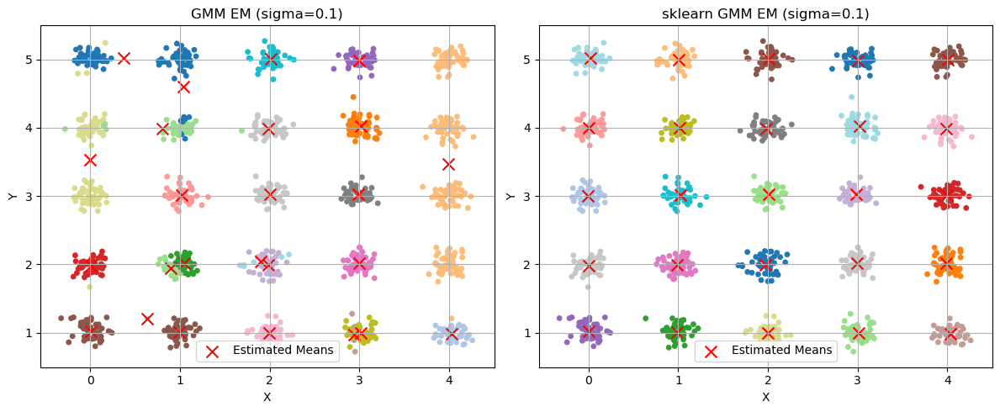

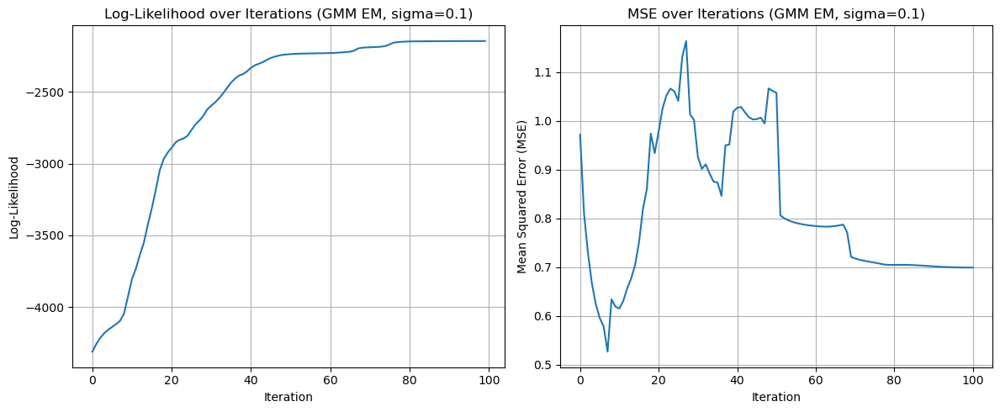




Running experiments for sigma = 0.5


/opt/conda/lib/python3.10/site-packages/sklearn/mixture/_base.py:274: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(


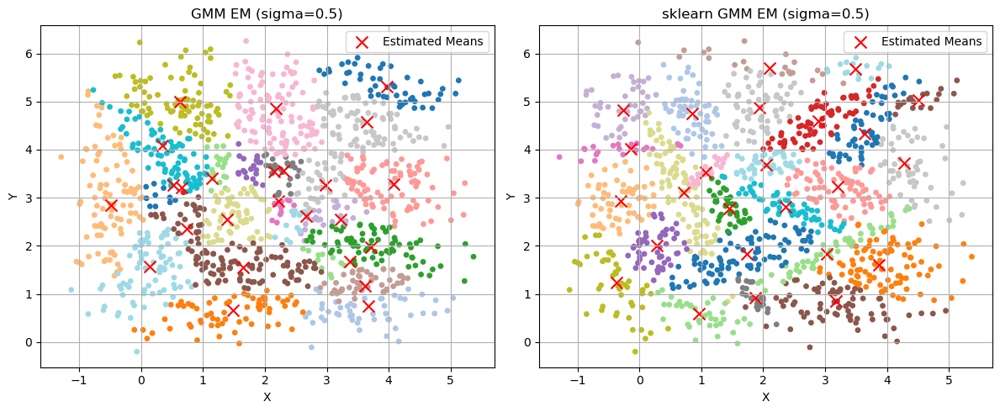

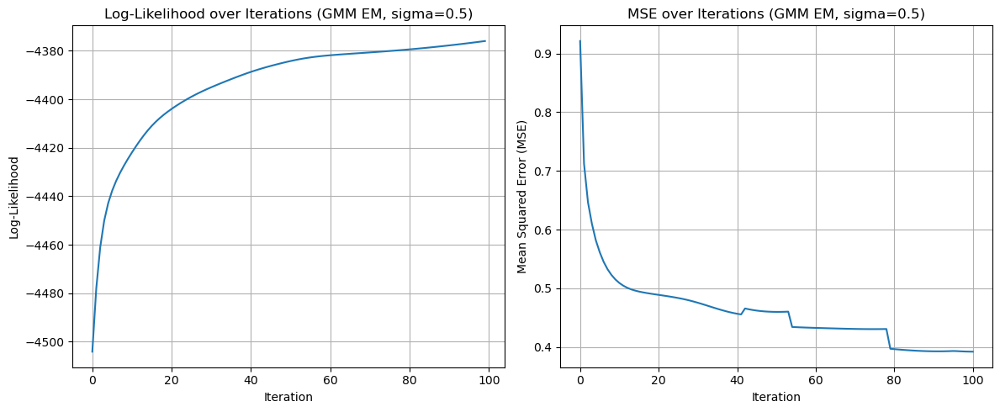




Running experiments for sigma = 0.7


/opt/conda/lib/python3.10/site-packages/sklearn/mixture/_base.py:274: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(


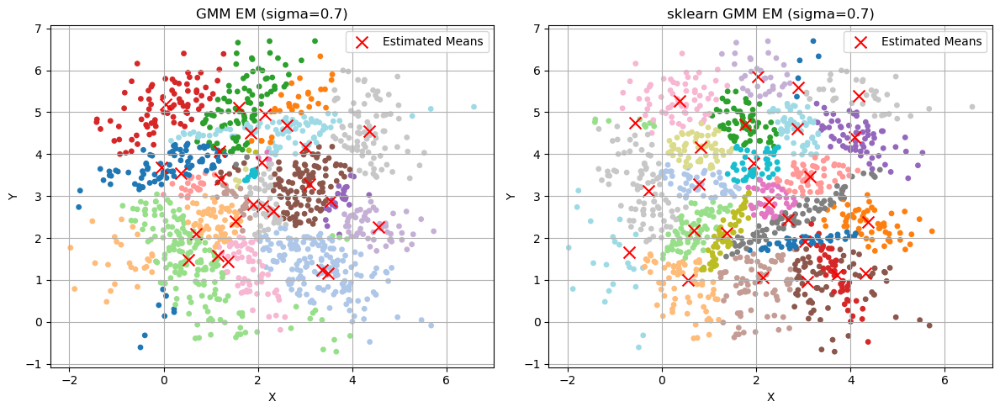

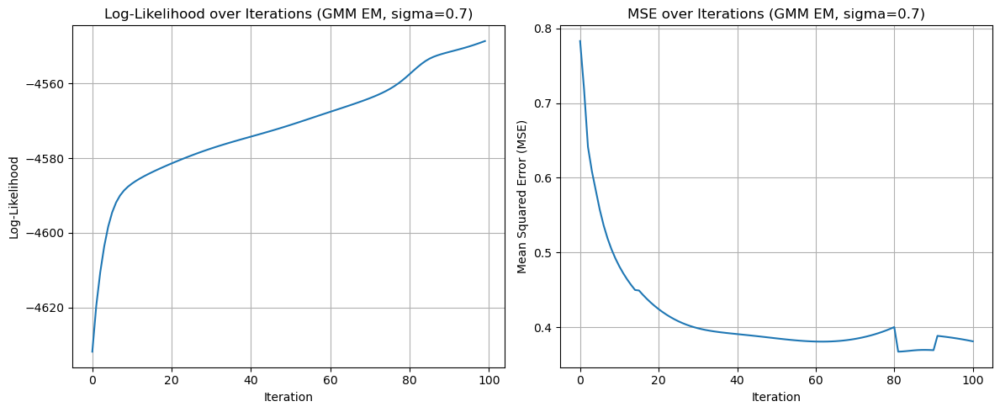




Running experiments for sigma = 1


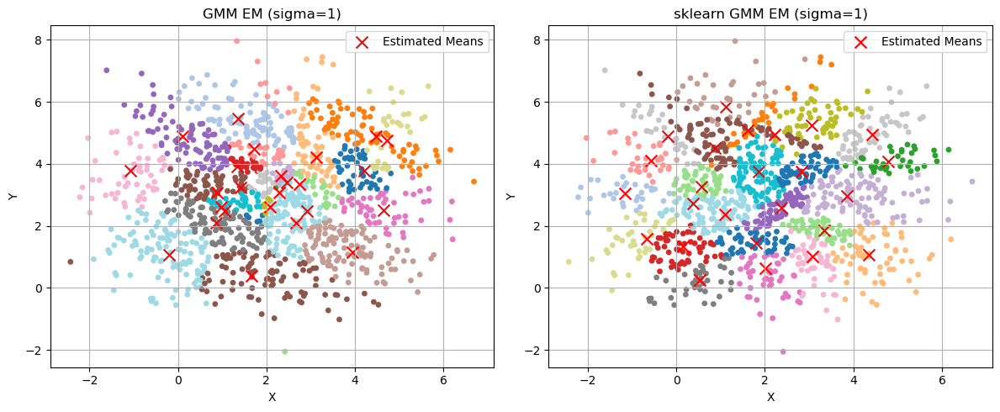

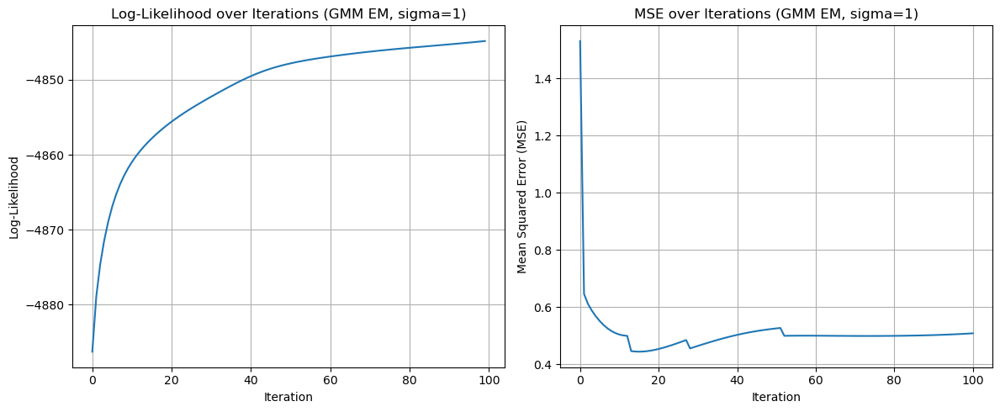

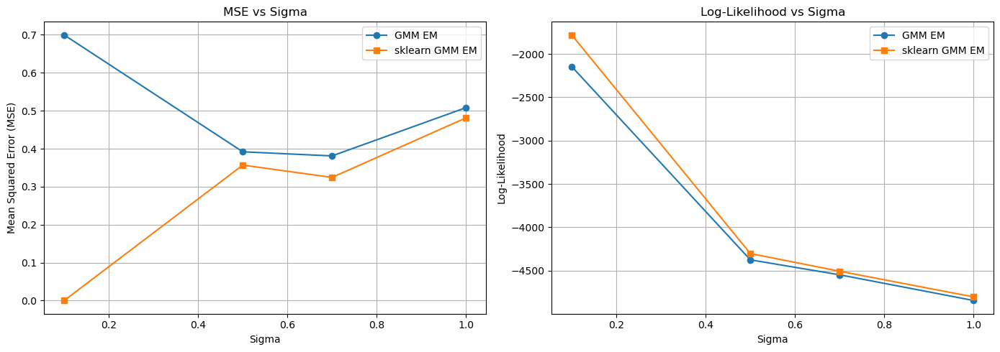

In [31]:
sigmas = [0.1, 0.5, 0.7, 1]
mse_gmm_em = []
mse_gmm_sklearn = []
log_likelihoods_gmm_em = []
log_likelihoods_gmm_sklearn = []

for sigma in sigmas:
    print(f"\n\n\nRunning experiments for sigma = {sigma}")
    N = 50
    cluster_centers = []
    data = []
    for x in range(5):
        for y in range(5):
            center = np.array([x, 5 - y])
            cluster_centers.append(center)
            points = np.random.randn(N, 2) * sigma + center
            data.append(points)
    data = np.vstack(data)
    cluster_centers = np.array(cluster_centers)
    K = len(cluster_centers)
    
    pi, mu, Sigma, gamma, log_likelihoods, means_history = gmm_em(data, K)
    labels = assign_clusters(gamma)

    mse_em = compute_mse(cluster_centers, mu)
    mse_gmm_em.append(mse_em)
    final_log_likelihood_em = log_likelihoods[-1]
    log_likelihoods_gmm_em.append(final_log_likelihood_em)
    
    pi_sk, mu_sk, Sigma_sk, gamma_sk, log_likelihoods_sk = gmm_em_sklearn(data, K)
    labels_sk = assign_clusters(gamma_sk)

    mse_sk = compute_mse(cluster_centers, mu_sk)
    mse_gmm_sklearn.append(mse_sk)
    final_log_likelihood_sklearn = log_likelihoods_sk[-1]
    log_likelihoods_gmm_sklearn.append(final_log_likelihood_sklearn)
  
    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.scatter(data[:, 0], data[:, 1], c=labels, cmap='tab20', s=15)
    plt.scatter(mu[:, 0], mu[:, 1], c='red', marker='x', s=100, label='Estimated Means')
    plt.title(f'GMM EM (sigma={sigma})')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.legend()
    plt.grid(True)

    plt.subplot(1, 2, 2)
    plt.scatter(data[:, 0], data[:, 1], c=labels_sk, cmap='tab20', s=15)
    plt.scatter(mu_sk[:, 0], mu_sk[:, 1], c='red', marker='x', s=100, label='Estimated Means')
    plt.title(f'sklearn GMM EM (sigma={sigma})')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.legend()
    plt.grid(True)
    
    plt.tight_layout()
    plt.show()

    mse_history = []
    for mu_iter in means_history:
        mse_iter = compute_mse(cluster_centers, mu_iter)
        mse_history.append(mse_iter)
    
    plt.figure(figsize=(12, 5))
    
    plt.subplot(1, 2, 1)
    plt.plot(log_likelihoods)
    plt.title(f'Log-Likelihood over Iterations (GMM EM, sigma={sigma})')
    plt.xlabel('Iteration')
    plt.ylabel('Log-Likelihood')
    plt.grid(True)
    
    plt.subplot(1, 2, 2)
    plt.plot(mse_history)
    plt.title(f'MSE over Iterations (GMM EM, sigma={sigma})')
    plt.xlabel('Iteration')
    plt.ylabel('Mean Squared Error (MSE)')
    plt.grid(True)
    
    plt.tight_layout()
    plt.show()

print("\n\n\n")
plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
plt.plot(sigmas, mse_gmm_em, marker='o', label='GMM EM')
plt.plot(sigmas, mse_gmm_sklearn, marker='s', label='sklearn GMM EM')
plt.title('MSE vs Sigma')
plt.xlabel('Sigma')
plt.ylabel('Mean Squared Error (MSE)')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(sigmas, log_likelihoods_gmm_em, marker='o', label='GMM EM')
plt.plot(sigmas, log_likelihoods_gmm_sklearn, marker='s', label='sklearn GMM EM')
plt.title('Log-Likelihood vs Sigma')
plt.xlabel('Sigma')
plt.ylabel('Log-Likelihood')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


---

### f

Contrary to k-mean,  GMM will be hard to use in a bisection context because of the probabilistic assignments of point s to multiple components. Furthermore the gaussian components can overlap due to the gaussian distribution making it difficult to choose component to split.

A possible heuristic workaround is to select the component to split based on the highest variance/covariance determinant.

If we want to do that we should change the nature & routine of the algorithm taking in account two new mean, re-running the EM algoritmh to optimize the new parameters...


---
---

## Exercise 5 - [10%]

### a

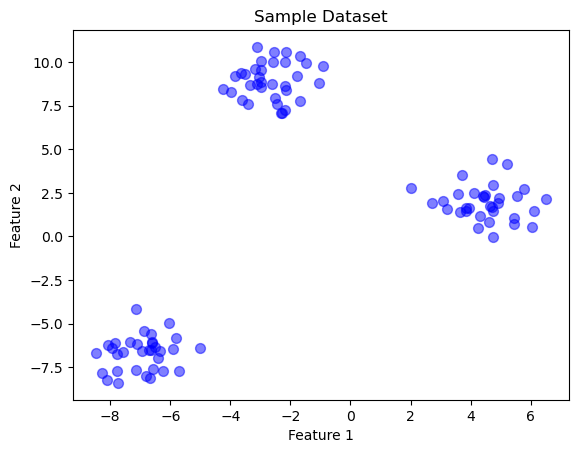

In [32]:
X, y_true = make_blobs(n_samples=100, centers=3, cluster_std=1.0, random_state=42)
N, d = X.shape

plt.scatter(X[:, 0], X[:, 1], c='blue', s=50, alpha=0.5)
plt.title('Sample Dataset')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.show()

In [20]:
def kernel_based_weights(X, sigma):
    gamma = 1 / (2 * sigma ** 2)
    pairwise_sq_dists = cdist(X, X, 'sqeuclidean')
    w = 1 / (1 + np.exp(-gamma * pairwise_sq_dists))
    reweighted_distances = w * np.sqrt(pairwise_sq_dists)
    return w, reweighted_distances

def flat_clustering_weights(X, n_clusters_list, n_runs=10):
    N = X.shape[0]
    counts = np.zeros((N, N))
    
    for n_clusters in n_clusters_list:
        for run in range(n_runs):
            kmeans = KMeans(n_clusters=n_clusters, n_init=1)
            labels = kmeans.fit_predict(X)
            for i in range(N):
                for j in range(N):
                    if labels[i] == labels[j]:
                        counts[i, j] += 1
    freq = counts / (len(n_clusters_list) * n_runs)
    w = freq
    return w

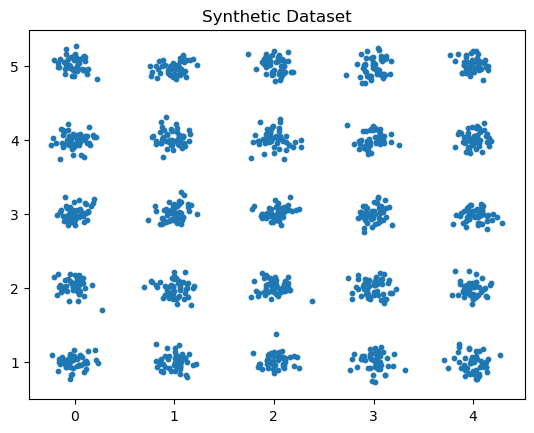

In [22]:
sigma = 0.1  
N = 50      
cluster_centers = []
data = []

for x in range(5):
    for y in range(5):
        center = np.array([x, 5 - y])
        cluster_centers.append(center)
        
        points = np.random.randn(N, 2) * sigma + center
        data.append(points)

data = np.vstack(data)
X = data 
cluster_centers = np.array(cluster_centers)

plt.scatter(X[:, 0], X[:, 1], s=10)
plt.title("Synthetic Dataset")
plt.show()

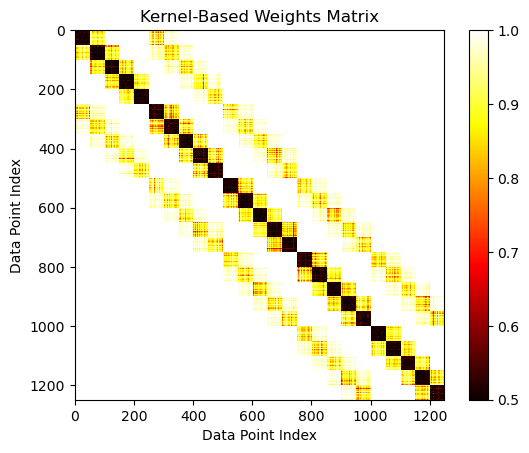

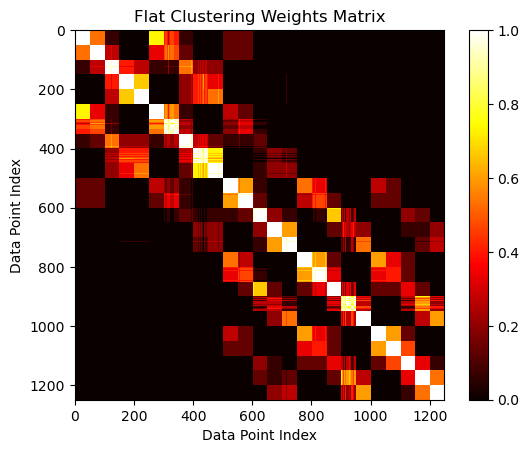

In [23]:
sigma_kernel = 0.5 
w_kernel, reweighted_distances_kernel = kernel_based_weights(X, sigma_kernel)

plt.imshow(w_kernel, cmap='hot', interpolation='nearest')
plt.colorbar()
plt.title("Kernel-Based Weights Matrix")
plt.xlabel('Data Point Index')
plt.ylabel('Data Point Index')
plt.show()

n_clusters_list = [5, 10, 15]
n_runs = 5
w_flat = flat_clustering_weights(X, n_clusters_list, n_runs)

plt.imshow(w_flat, cmap='hot', interpolation='nearest')
plt.colorbar()
plt.title("Flat Clustering Weights Matrix")
plt.xlabel('Data Point Index')
plt.ylabel('Data Point Index')
plt.show()